In [4]:
import re
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import emoji
import pickle
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score,f1_score, precision_score, recall_score 
from sklearn.model_selection import train_test_split, KFold, cross_val_score
import pandas as pd
import string

import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from scipy.sparse import csr_matrix
from sklearn.preprocessing import normalize
import numpy as np 
from nltk.tokenize import word_tokenize #text.split()

from sklearn.naive_bayes import ComplementNB


# IMPORT FILE

In [2]:
# import file alay

slang_words = pd.read_csv('dict/slang_words.csv', header=None)
slang_words = slang_words.rename(columns={0: 'original', 1: 'replacement'}) 

#membuat jadi dictionary
slang_words_map = dict(zip(slang_words['original'], slang_words['replacement']))

In [3]:
#import kamus kata-kata positif

positive_dict = pd.read_csv('dict/kamus_positif.csv')
dict_positive = positive_dict.to_dict()

In [4]:
id_stopword_dict = pd.read_csv('dict/stopwordbahasa.csv', header=None)
id_stopword_dict = id_stopword_dict.rename(columns={0: 'stopword'})

In [5]:
df = pd.read_csv('dataset/dataset_komentar_instagram_cyberbullying.csv') #dataset awal untuk nge predict edom

In [6]:
df

,Id,Sentiment,Instagram Comment Text
0,1,negative,<USERNAME> TOLOL!! Gak ada hubungan nya kegug...
1,2,negative,Geblek lo tata...cowo bgt dibela2in balikan......
2,3,negative,Kmrn termewek2 skr lengket lg duhhh kok labil ...
3,4,negative,"Intinya kalau kesel dengan ATT nya, gausah ke ..."
4,5,negative,"hadewwwww permpuan itu lg!!!!sakit jiwa,knp ha..."
...,...,...,...
395,396,positive,Bangga sama suami yg selalu ingat istri disela...
396,397,positive,Apaoun pekerjaannya yg penting halal u tuk men...
397,398,positive,Gojek itu mayoritas pegangguran yang lama gak ...
398,399,positive,<USERNAME> aslinya cantik dan ayu loh mbak kr...


In [7]:
df = df.drop('Id', axis=1)

In [8]:
df=df.drop_duplicates()

In [9]:
df

,Sentiment,Instagram Comment Text
0,negative,<USERNAME> TOLOL!! Gak ada hubungan nya kegug...
1,negative,Geblek lo tata...cowo bgt dibela2in balikan......
2,negative,Kmrn termewek2 skr lengket lg duhhh kok labil ...
3,negative,"Intinya kalau kesel dengan ATT nya, gausah ke ..."
4,negative,"hadewwwww permpuan itu lg!!!!sakit jiwa,knp ha..."
...,...,...
395,positive,Bangga sama suami yg selalu ingat istri disela...
396,positive,Apaoun pekerjaannya yg penting halal u tuk men...
397,positive,Gojek itu mayoritas pegangguran yang lama gak ...
398,positive,<USERNAME> aslinya cantik dan ayu loh mbak kr...


# FUNCTION

In [10]:
def remove_emoji_utf8(text):
    
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    
    text = re.sub(emoj, '', text)
    
    """" MENGHILANNGKAN EMOJI """
    text = emoji.demojize(text)
                  
    """ MENGHILANGKAN UNICODE DARI UTF-8 """
    text = text.encode('utf-8', errors='ignore').decode('unicode-escape', errors='ignore')
    
    text = text.encode("ascii", 'ignore')
    text = text.decode("ascii")
    
    
    #print(text)
    
    return text

In [11]:
def remove_symbol(text):
    
    """ RUBAH MENJADI HURUF KECIL """
    text = text.lower()
    
    """ MENGHILANGKAN RT """
    
    text = re.compile('rt @').sub('@', text, count=1).strip()
    
    """ MENGHILANGKAN HASHTAG """
    text = re.sub(r'#([^\s]+)', '  ', text)
    
    """ MENGHILANGKAN USERNAME """
    text = re.sub('@[^\s]+','  ',text)  
    text = re.sub('<USERNAME>',' ',text)
    
    """ MENGHILANGKAN URL """
    
    text = re.sub('(www\.[^\s]+)|(https?://[^\s]+)','  ',text)
    
    return text

In [12]:
def remove_karakter(edom_respond):

    edom_respond = re.sub(r"\\n", ' ', edom_respond) #hilangin enter

    edom_respond = edom_respond.translate(str.maketrans("  ","  ",string.punctuation)) #hilangin tanda baca lainnya
    
    edom_respond = ''.join([i for i in edom_respond if not i.isdigit()]) #MENGHILANGKAN ANGKA
    edom_respond = re.sub(r'\s+', ' ', edom_respond).strip() #menghilangkan spasi berlebih

    edom_respond = ' '.join( [w for w in edom_respond.split() if len(w)>1]) #MENGHILANGKAN HURUF SATUAN ex 'aaku' jadi aku
    edom_respond = re.sub(r'(.+?)\1+', r'\1', edom_respond) #MENGHILANGKAN HURUF SATUAN ex 'aku a' a akan ilang
    edom_respond = re.sub(r'\s+', ' ', edom_respond).strip() #menghilangkan spasi berlebih

    
    edom_respond = ' '.join([slang_words_map[word] if word in slang_words_map else word for word in edom_respond.split(' ')]) #MERUBAH BAHASA SLANG
    edom_respond = re.sub(r'\s+', ' ', edom_respond).strip() #menghilangkan spasi berlebih

    #print(edom_respond)

    return edom_respond

In [13]:
def stopwords_text(edom_respond):
    """ MENGHILANGKAN STOPWORD """
    edom_respond = ' '.join(['' if word in id_stopword_dict.stopword.values else word for word in edom_respond.split(' ')])
    edom_respond = re.sub('  +', ' ', edom_respond) # Remove extra spaces
    edom_respond = edom_respond.strip()
    #print(edom_respond)
    return edom_respond

In [14]:
factory_stem = StemmerFactory()
stemmer = factory_stem.create_stemmer()

def stemming_text(edom_respond):
    
    edom_respond = stemmer.stem(edom_respond)
    
    #print(edom_respond)
    return edom_respond

## TFIDF

In [15]:
def IDF(corpus, unique_words):
  idf_dict ={}
  N=len(corpus)
  for i in unique_words:
    count =0
    for sent in corpus:
      if i in sent.split():
        count=count+1
      idf_dict[i]=(1+np.log10((1+N)/(count+1)))
  return idf_dict

In [16]:
def fit(whole_data):

  unique_words = set()
  if isinstance(whole_data, (list,)):
    for x in whole_data:
      for y in x.split():
        if len(y)<2:
          continue
          #print(y)
        unique_words.add(y)
  unique_words = sorted(list(unique_words))
  vocab = {j:i for i,j in enumerate(unique_words)}
  Idf_values_of_all_unique_words=IDF(whole_data,unique_words)
  return vocab, Idf_values_of_all_unique_words
      

In [17]:
def transform(dataset,vocabulary,idf_values):
    sparse_matrix= csr_matrix( (len(dataset), len(vocabulary)), dtype=np.float64)
    for row  in range(0,len(dataset)):
        number_of_words_in_sentence=Counter(dataset[row].split())
        for word in dataset[row].split():
            if word in list(vocabulary.keys()):
                if word in list(dict_positive.values()):
                    tf_idf_value=((number_of_words_in_sentence[word]/len(dataset[row].split()))*(idf_values[word]))+1
                else:
                    tf_idf_value=((number_of_words_in_sentence[word]/len(dataset[row].split()))*(idf_values[word]))

                sparse_matrix[row,vocabulary[word]]=tf_idf_value
    output =normalize(sparse_matrix, norm='l2', axis=1, copy=True, return_norm=False)
    return output

# TEXT PROCESSING DATASET AWAL GITHUB

In [18]:
df['remove_emoji'] = df['Instagram Comment Text'].apply(lambda text: remove_emoji_utf8(text))

In [19]:
df['remove_symbol'] = df['remove_emoji'].apply(lambda text:remove_symbol(text))

In [20]:
df['remove_karakter'] = df['remove_symbol'].apply(lambda text: remove_karakter(text))

In [21]:
#df['stemming_text'] = df['stopword_text'].apply(lambda text: stemming_text(text))
df['stemming_text'] = df['remove_karakter'].apply(lambda text: stemming_text(text))

In [22]:
df

,Sentiment,Instagram Comment Text,remove_emoji,remove_symbol,remove_karakter,stemming_text
0,negative,<USERNAME> TOLOL!! Gak ada hubungan nya kegug...,<USERNAME> TOLOL!! Gak ada hubungan nya kegug...,<username> tolol!! gak ada hubungan nya kegugu...,nama pengguna tol tidak ada hubungan nya kegur...,nama guna tol tidak ada hubung nya keguran den...
1,negative,Geblek lo tata...cowo bgt dibela2in balikan......,Geblek lo tata...cowo bgt dibela2in balikan......,geblek lo tata...cowo bgt dibela2in balikan......,geblek kamu tacowo banget dibela balikanhadewn...,geblek kamu tacowo banget bela balikanhadewnta...
2,negative,Kmrn termewek2 skr lengket lg duhhh kok labil ...,Kmrn termewek2 skr lengket lg duhhh kok labil ...,kmrn termewek2 skr lengket lg duhhh kok labil ...,kemarin termewek sekarang lengket lagi aduh ko...,kemarin mewek sekarang lengket lagi aduh kok l...
3,negative,"Intinya kalau kesel dengan ATT nya, gausah ke ...","Intinya kalau kesel dengan ATT nya, gausah ke ...","intinya kalau kesel dengan att nya, gausah ke ...",intinya kalau kesal dengan at nya tidak usah k...,inti kalau kesal dengan at nya tidak usah ke a...
4,negative,"hadewwwww permpuan itu lg!!!!sakit jiwa,knp ha...","hadewwwww permpuan itu lg!!!!sakit jiwa,knp ha...","hadewwwww permpuan itu lg!!!!sakit jiwa,knp ha...",hadew permpuan itu lgsakit jiwaknp harus dia y...,hadew permpuan itu lgsakit jiwaknp harus dia y...
...,...,...,...,...,...,...
395,positive,Bangga sama suami yg selalu ingat istri disela...,Bangga sama suami yg selalu ingat istri disela...,bangga sama suami yg selalu ingat istri disela...,bangsa sama suami yang selalu ingat istri dise...,bangsa sama suami yang selalu ingat istri sela...
396,positive,Apaoun pekerjaannya yg penting halal u tuk men...,Apaoun pekerjaannya yg penting halal u tuk men...,apaoun pekerjaannya yg penting halal u tuk men...,apapun pekerjanya yang penting hal untuk menaf...,apa kerja yang penting hal untuk nafkah keluar...
397,positive,Gojek itu mayoritas pegangguran yang lama gak ...,Gojek itu mayoritas pegangguran yang lama gak ...,gojek itu mayoritas pegangguran yang lama gak ...,gojek itu mayoritas peganguran yang lama tidak...,gojek itu mayoritas peganguran yang lama tidak...
398,positive,<USERNAME> aslinya cantik dan ayu loh mbak kr...,<USERNAME> aslinya cantik dan ayu loh mbak kr...,<username> aslinya cantik dan ayu loh mbak krn...,nama pengguna aslinya cantik dan ayo lah mbak ...,nama guna asli cantik dan ayo lah mbak karena ...


## SPLIT DATASET

In [23]:
X_train, X_test, y_train, y_test = train_test_split(df['stemming_text'], df['Sentiment'],
                                                    test_size=0.2, random_state=42)

In [24]:
corpus_train = X_train.tolist()
corpus_test = X_test.tolist()

## TFIDF

In [25]:
#train
Vocabulary, idf_of_vocabulary=fit(corpus_train)

In [26]:
final_data_train= transform(corpus_train, Vocabulary, idf_of_vocabulary)
final_tfidf_data_train = final_data_train.toarray()

c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


In [27]:
final_data_test = transform(corpus_test, Vocabulary, idf_of_vocabulary)
final_tfidf_data_test = final_data_test.toarray()

## ALGORITMA NAIVE

In [28]:
daftar_alpha = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

In [29]:
hasil_prediksi_test = []
for k in daftar_alpha:
  model_naive = ComplementNB(alpha=k).fit(final_tfidf_data_train, y_train) 
  predicted_naive = model_naive.predict(final_tfidf_data_test)
  accuracy = accuracy_score(y_test, predicted_naive)*100
  
  print("Alpha = " + str(k))
  print(accuracy)
  print(classification_report(y_test, predicted_naive))

  print('Recall: {}'.format(recall_score(y_test, predicted_naive, average='macro')))
  print('Precision: {}'.format(precision_score(y_test, predicted_naive, average='macro')))
  print('F1-Score: {}'.format(f1_score(y_test, predicted_naive, average='macro')))

  hasil_prediksi_test.append(accuracy)

  print("\n\n")

Alpha = 0.1
88.75
              precision    recall  f1-score   support

    negative       0.89      0.91      0.90        46
    positive       0.88      0.85      0.87        34

    accuracy                           0.89        80
   macro avg       0.89      0.88      0.88        80
weighted avg       0.89      0.89      0.89        80

Recall: 0.8829923273657289
Precision: 0.8862024500322372
F1-Score: 0.8844487241213288



Alpha = 0.2
88.75
              precision    recall  f1-score   support

    negative       0.89      0.91      0.90        46
    positive       0.88      0.85      0.87        34

    accuracy                           0.89        80
   macro avg       0.89      0.88      0.88        80
weighted avg       0.89      0.89      0.89        80

Recall: 0.8829923273657289
Precision: 0.8862024500322372
F1-Score: 0.8844487241213288



Alpha = 0.3
88.75
              precision    recall  f1-score   support

    negative       0.89      0.91      0.90        46
    p

# PREDICT NEW LABEL FOR DATASET EDOM - GAPERLU DI RUNNING LAGI

## BASED DATASET

In [31]:
df_edom = pd.read_csv('dataset/dataset 1.csv')

In [32]:
df_edom

,PERTANYAAN,JAWABAN,PRODI,FAKULTAS
0,Berikan masukan untuk meningkatkan layanan Kem...,baik,S1 Teknik Telekomunikasi,FTE
1,Berikan masukan untuk meningkatkan layanan Kem...,Sudah bagus.,S1 Teknik Telekomunikasi,FTE
2,Berikan masukan untuk meningkatkan layanan Kem...,Lebih ditingkatkan lagi,S1 Teknik Telekomunikasi,FTE
3,Berikan masukan untuk meningkatkan layanan Kem...,"mantap, pertahankan, dan tingkatkan",S1 Teknik Telekomunikasi,FTE
4,Berikan masukan untuk meningkatkan layanan Kem...,c,S1 Teknik Telekomunikasi,FTE
...,...,...,...,...
209491,Berikan saran/masukan Saudara/i terkait dengan...,sudah baik,D4 Teknologi Rekayasa Multimedia,FIT
209492,Berikan saran/masukan Saudara/i terkait dengan...,cukup baik,D4 Teknologi Rekayasa Multimedia,FIT
209493,Berikan saran/masukan Saudara/i terkait dengan...,"Cukup baik, tapi diharapkan di beberapa acara ...",D4 Teknologi Rekayasa Multimedia,FIT
209494,Berikan saran/masukan Saudara/i terkait dengan...,menjadi lebih baik dan tetap menjadi yang terbaik,D4 Teknologi Rekayasa Multimedia,FIT


In [33]:
df_edom = df_edom.dropna()

In [34]:
df_edom

,PERTANYAAN,JAWABAN,PRODI,FAKULTAS
0,Berikan masukan untuk meningkatkan layanan Kem...,baik,S1 Teknik Telekomunikasi,FTE
1,Berikan masukan untuk meningkatkan layanan Kem...,Sudah bagus.,S1 Teknik Telekomunikasi,FTE
2,Berikan masukan untuk meningkatkan layanan Kem...,Lebih ditingkatkan lagi,S1 Teknik Telekomunikasi,FTE
3,Berikan masukan untuk meningkatkan layanan Kem...,"mantap, pertahankan, dan tingkatkan",S1 Teknik Telekomunikasi,FTE
4,Berikan masukan untuk meningkatkan layanan Kem...,c,S1 Teknik Telekomunikasi,FTE
...,...,...,...,...
209491,Berikan saran/masukan Saudara/i terkait dengan...,sudah baik,D4 Teknologi Rekayasa Multimedia,FIT
209492,Berikan saran/masukan Saudara/i terkait dengan...,cukup baik,D4 Teknologi Rekayasa Multimedia,FIT
209493,Berikan saran/masukan Saudara/i terkait dengan...,"Cukup baik, tapi diharapkan di beberapa acara ...",D4 Teknologi Rekayasa Multimedia,FIT
209494,Berikan saran/masukan Saudara/i terkait dengan...,menjadi lebih baik dan tetap menjadi yang terbaik,D4 Teknologi Rekayasa Multimedia,FIT


In [35]:
df_edom['remove_emoji'] = df_edom['JAWABAN'].apply(lambda text: remove_emoji_utf8(text))

c:\Users\dianr\.conda\envs\text\lib\site-packages\ipykernel_launcher.py:30: DeprecationWarning: invalid escape sequence '\d'
c:\Users\dianr\.conda\envs\text\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [36]:
df_edom['remove_symbol'] = df_edom['remove_emoji'].apply(lambda text: remove_symbol(text))

c:\Users\dianr\.conda\envs\text\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [37]:
df_edom['remove_karakter'] = df_edom['remove_symbol'].apply(lambda text: remove_karakter(text))

c:\Users\dianr\.conda\envs\text\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [38]:
for i in df_edom['remove_karakter']:
    print(i)

baik
sudah bagus
lebih ditingkatkan lagi
mantap pertahankan dan tingkatkan

terakhir saya mengurus tidak kurang lebih bulan lalu saya merasa waktu proses cukup lama mungkin karena antre cuma kurang tahu proses saat ini semoga tambah baik terima kasih
semoga semakin bagus lagi
pertahankan kualitas dan tingkatkan
tingkatkan lagi
tingkatkan

baik
sudah cukup bagus
keaman dan kualitas air ditingkatkan
respons admin dipercepat

berharap it gets lebih baik

cukup
sudah baik mungkin untuk lebih ditingkatkan lagi
perbanyak jalur beasiswa
sudah bagus
sudah sangat baik


sudah baik terus tingkatkan
sudah baik alangkah baiknya lebih ditingkatkan lagih
sudah baik
perlu di tingkatkan
sudah baik

permudah dan bantu yang kupu
cukup
terus tingkatkan
tingkatkan kualitas tempat pelayan kesehatan seperti tenaga medis yang mumpuni pelayan jam jika ada keadan darurat

sudah baik
sudah sangat baik
tingkatkan lagi
lebih ditingkatkan lagi
sudah baik dipertahankam
sudah baik

lebih dipercepat acnya

shes
oke
s

In [43]:
data_clean_edom = []
for i in df_edom['remove_karakter']:
    if i is not "":
        if i is not " ":
            print(i)
            data_clean_edom.append(i)

baik
sudah bagus
lebih ditingkatkan lagi
mantap pertahankan dan tingkatkan
terakhir saya mengurus tidak kurang lebih bulan lalu saya merasa waktu proses cukup lama mungkin karena antre cuma kurang tahu proses saat ini semoga tambah baik terima kasih
semoga semakin bagus lagi
pertahankan kualitas dan tingkatkan
tingkatkan lagi
tingkatkan
baik
sudah cukup bagus
keaman dan kualitas air ditingkatkan
respons admin dipercepat
berharap it gets lebih baik
cukup
sudah baik mungkin untuk lebih ditingkatkan lagi
perbanyak jalur beasiswa
sudah bagus
sudah sangat baik
sudah baik terus tingkatkan
sudah baik alangkah baiknya lebih ditingkatkan lagih
sudah baik
perlu di tingkatkan
sudah baik
permudah dan bantu yang kupu
cukup
terus tingkatkan
tingkatkan kualitas tempat pelayan kesehatan seperti tenaga medis yang mumpuni pelayan jam jika ada keadan darurat
sudah baik
sudah sangat baik
tingkatkan lagi
lebih ditingkatkan lagi
sudah baik dipertahankam
sudah baik
lebih dipercepat acnya
shes
oke
sudah bagus

In [44]:
corpus_new = data_clean_edom

In [45]:
df_edom_naive_based_dataset  = pd.DataFrame(corpus_new, columns =['edom'])

In [46]:
df_edom_naive_based_dataset['stemming'] = df_edom_naive_based_dataset['edom'].apply(lambda text: stemming_text(text))

In [47]:
stemming_baru = df_edom_naive_based_dataset['stemming'].tolist()

In [48]:
final_data_new_stem= transform(stemming_baru, Vocabulary, idf_of_vocabulary)
final_tfidf_data_new_stem = final_data_new_stem.toarray()

c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


In [49]:
model_naive_detect_based_datasets = ComplementNB(alpha=0.2).fit(final_tfidf_data_train, y_train) 
predicted_naive_based_datasets = model_naive_detect_based_datasets.predict(final_tfidf_data_new_stem)

In [50]:
df_edom_naive_based_dataset['label'] = predicted_naive_based_datasets

In [51]:
df_edom_naive_based_dataset.to_csv(r'data_edom_dataset_predict.csv', index = False, header = True,index_label=None)

# ALGORITMA NAIVE EDOM BASED ON DATASET EDOM 

## 30rb data

In [52]:
df_edom_naive_check_dataset30s = pd.read_csv('data_edom_dataset_predict.csv')

In [53]:
df_edom_naive_check_dataset30s

,edom,stemming,label
0,baik,baik,positive
1,sudah bagus,sudah bagus,positive
2,lebih ditingkatkan lagi,lebih tingkat lagi,positive
3,mantap pertahankan dan tingkatkan,mantap tahan dan tingkat,positive
4,terakhir saya mengurus tidak kurang lebih bula...,akhir saya urus tidak kurang lebih bulan lalu ...,positive
...,...,...,...
151582,sudah baik,sudah baik,positive
151583,cukup baik,cukup baik,positive
151584,cukup baik tapi diharapkan di berapa acara tid...,cukup baik tapi harap di berapa acara tidak wajib,negative
151585,menjadi lebih baik dan tetap menjadi yang terbaik,jadi lebih baik dan tetap jadi yang baik,positive


In [54]:
df_edom_naive_check_dataset30s = df_edom_naive_check_dataset30s.drop_duplicates()
df_edom_naive_check_dataset30s

,edom,stemming,label
0,baik,baik,positive
1,sudah bagus,sudah bagus,positive
2,lebih ditingkatkan lagi,lebih tingkat lagi,positive
3,mantap pertahankan dan tingkatkan,mantap tahan dan tingkat,positive
4,terakhir saya mengurus tidak kurang lebih bula...,akhir saya urus tidak kurang lebih bulan lalu ...,positive
...,...,...,...
151572,semangat untuk membing mahasiswa,semangat untuk membing mahasiswa,positive
151574,mempermudah akses lms,mudah akses lms,positive
151575,lebih di tingkatkan lagi layan online agar mud...,lebih di tingkat lagi layan online agar mudah ...,positive
151580,bagus dan adanya lms memudahkan kita yang bela...,bagus dan ada lms mudah kita yang ajar online,positive


In [55]:
test_size_num = [0.1, 0.2, 0.3, 0.4, 0.5]
parameter_alpha = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

In [56]:
corpus_data = df_edom_naive_check_dataset30s['stemming'].tolist()
all_vocabulary, idf_of_all_vocabulary = fit(corpus_data)

In [57]:
final_data_transform = transform(corpus_data, all_vocabulary ,idf_of_all_vocabulary)
final_tfidf_all_data = final_data_transform.toarray()

c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


### TEST SIZE = 0.1

#### TRANSFORM 1

In [58]:
X_train_edom_based_dataset_1_30s, X_test_edom_based_dataset_1_30s, y_train_edom_based_dataset_1_30s, y_test_edom_based_dataset_1_30s = train_test_split(
    df_edom_naive_check_dataset30s['stemming'], df_edom_naive_check_dataset30s['label'],
                                                    test_size=0.1, random_state=42)

    
corpus_train_edom_based_dataset_1_30s = X_train_edom_based_dataset_1_30s.to_list()
corpus_test_edom_based_dataset_1_30s = X_test_edom_based_dataset_1_30s.to_list()



In [59]:
Vocabulary_edom_based_dataset_1_30s, idf_of_vocabulary_edom_based_dataset_1_30s=fit(corpus_train_edom_based_dataset_1_30s)

In [60]:
#train

final_data_train_edom_based_dataset_1_30s_tf1= transform(corpus_train_edom_based_dataset_1_30s, Vocabulary_edom_based_dataset_1_30s, idf_of_vocabulary_edom_based_dataset_1_30s)
final_tfidf_data_train_edom_based_dataset_1_30s_tf1 = final_data_train_edom_based_dataset_1_30s_tf1.toarray()

#test

final_data_test_edom_based_dataset_1_30s_tf1= transform(corpus_test_edom_based_dataset_1_30s, Vocabulary_edom_based_dataset_1_30s, idf_of_vocabulary_edom_based_dataset_1_30s)
final_tfidf_data_test_edom_based_dataset_1_30s_tf1 = final_data_test_edom_based_dataset_1_30s_tf1.toarray()

In [61]:
hasil_akurasi_test_1_30s_tf1 = []
hasil_recall_test_1_30s_tf1 = []
hasil_presisi_test_1_30s_tf1 = []
hasil_f2_test_1_30s_tf1 = []

for k in parameter_alpha:

    model_naive_based_dataset_1 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_1_30s_tf1, y_train_edom_based_dataset_1_30s) 
        
    predicted_naive_edom_based_dataset_1 = model_naive_based_dataset_1.predict(final_tfidf_data_test_edom_based_dataset_1_30s_tf1)
    accuracy_based_dataset_1 = accuracy_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1)*100
        
    print("Alpha = " + str(k))
    print("\n\n")
    print("accuracy = " + str(accuracy_based_dataset_1))
    print(classification_report(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1))

    recall_hasil = recall_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1, average='macro')
    presisi_hasil = precision_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1, average='macro')
    f2_hasil = f1_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1, average='macro')

    print('Recall: {}'.format(recall_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1, average='macro')))
    print('Precision: {}'.format(precision_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1, average='macro')))
    print('F2-Score: {}'.format(f1_score(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1, average='macro')))

    hasil_akurasi_test_1_30s_tf1.append(accuracy_based_dataset_1)
    hasil_recall_test_1_30s_tf1.append(recall_hasil)
    hasil_presisi_test_1_30s_tf1.append(presisi_hasil)
    hasil_f2_test_1_30s_tf1.append(f2_hasil)

    print("\n\n")

Alpha = 0.1



accuracy = 85.78828099708645
              precision    recall  f1-score   support

    negative       0.71      0.78      0.74       822
    positive       0.92      0.89      0.90      2267

    accuracy                           0.86      3089
   macro avg       0.82      0.83      0.82      3089
weighted avg       0.86      0.86      0.86      3089

Recall: 0.8326115631342321
Precision: 0.8152301060306455
F2-Score: 0.8230831983369647



Alpha = 0.2



accuracy = 85.7235351246358
              precision    recall  f1-score   support

    negative       0.72      0.76      0.74       822
    positive       0.91      0.89      0.90      2267

    accuracy                           0.86      3089
   macro avg       0.82      0.83      0.82      3089
weighted avg       0.86      0.86      0.86      3089

Recall: 0.8271301343619497
Precision: 0.8151083342637736
F2-Score: 0.820725691353175



Alpha = 0.3



accuracy = 85.75590806086112
              precision    recall  f1-

ALPHA =  0.1
[[ 640  182]
 [ 257 2010]]


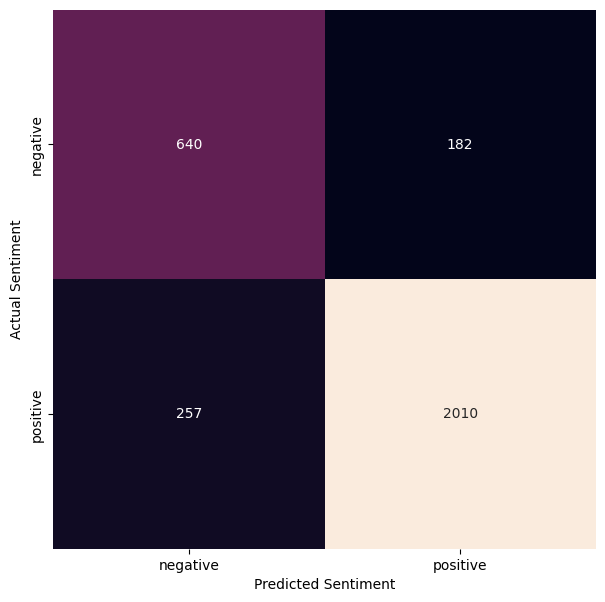

ALPHA =  0.2
[[ 627  195]
 [ 246 2021]]


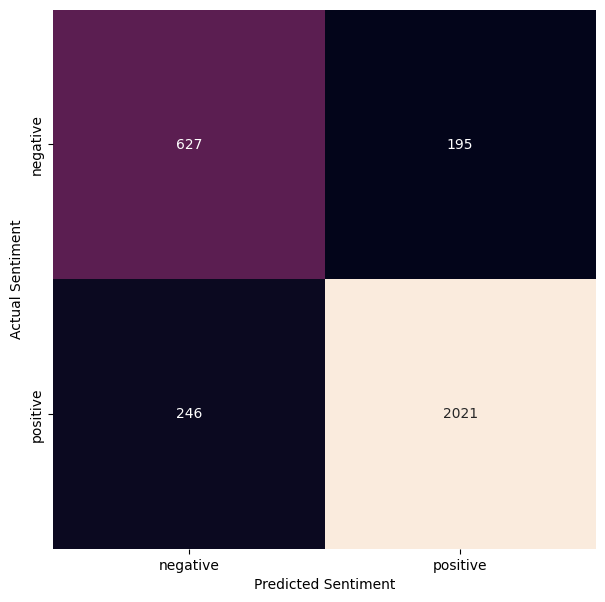

ALPHA =  0.3
[[ 609  213]
 [ 227 2040]]


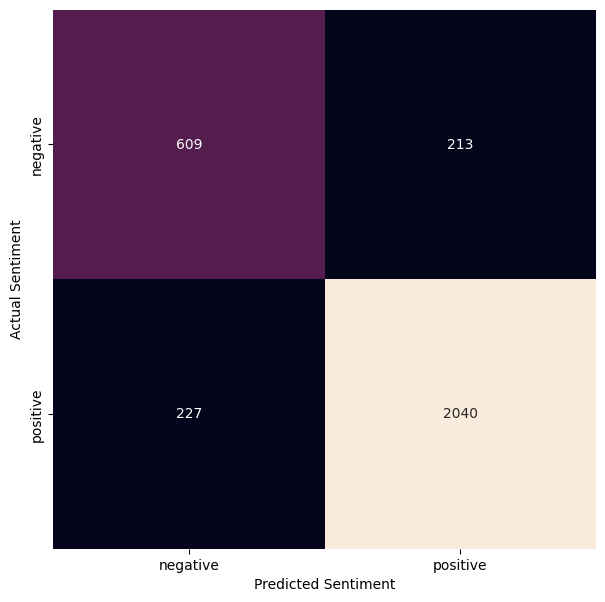

ALPHA =  0.4
[[ 597  225]
 [ 209 2058]]


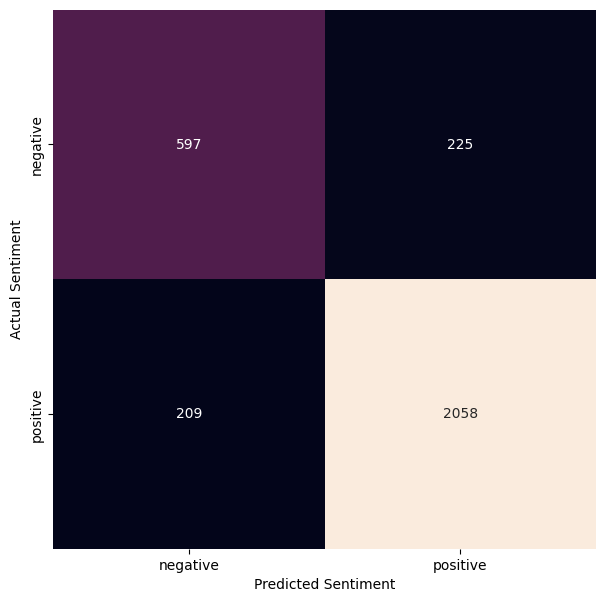

ALPHA =  0.5
[[ 589  233]
 [ 196 2071]]


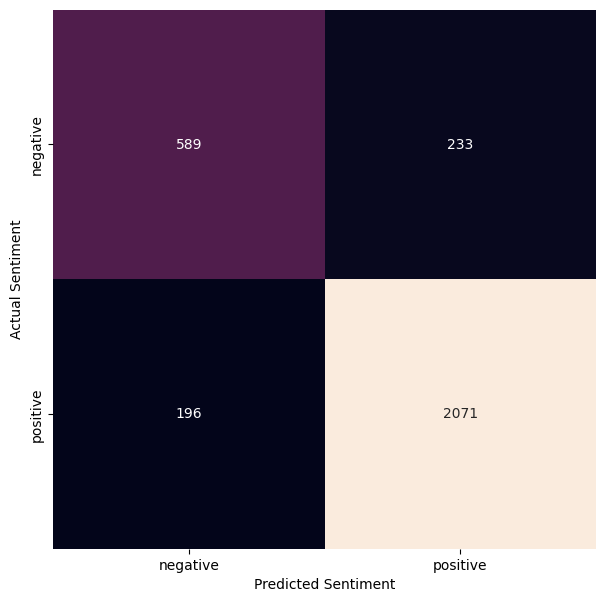

ALPHA =  0.6
[[ 572  250]
 [ 176 2091]]


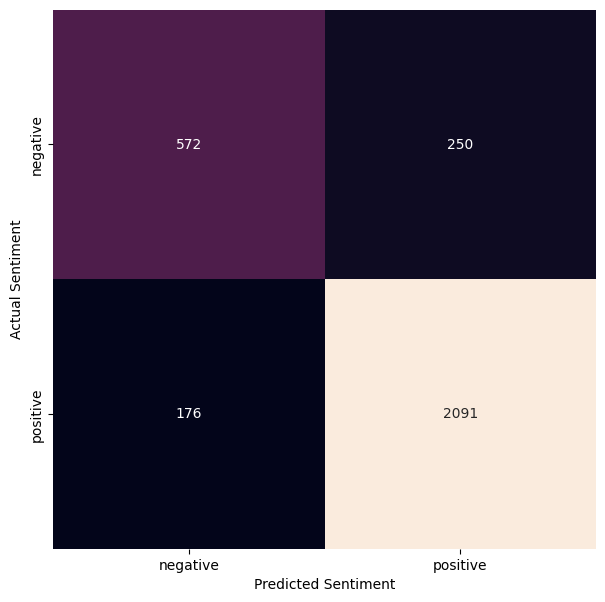

ALPHA =  0.7
[[ 559  263]
 [ 169 2098]]


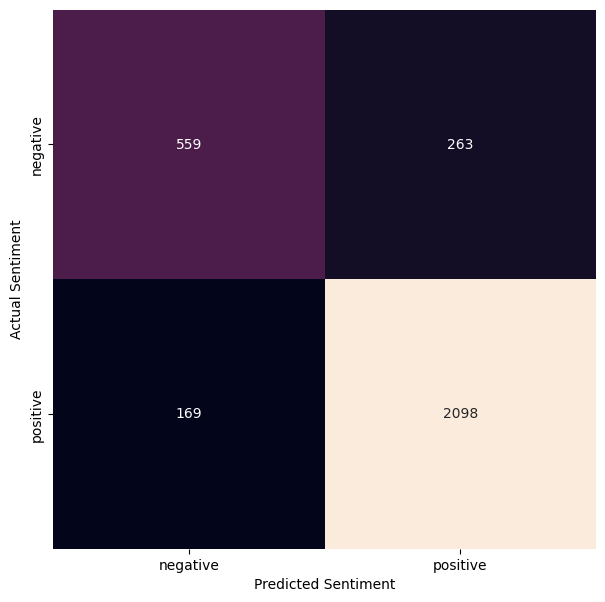

ALPHA =  0.8
[[ 545  277]
 [ 160 2107]]


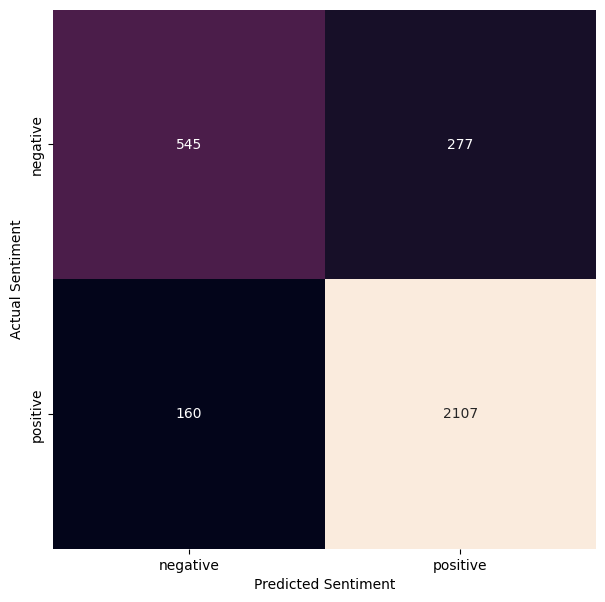

ALPHA =  0.9
[[ 530  292]
 [ 153 2114]]


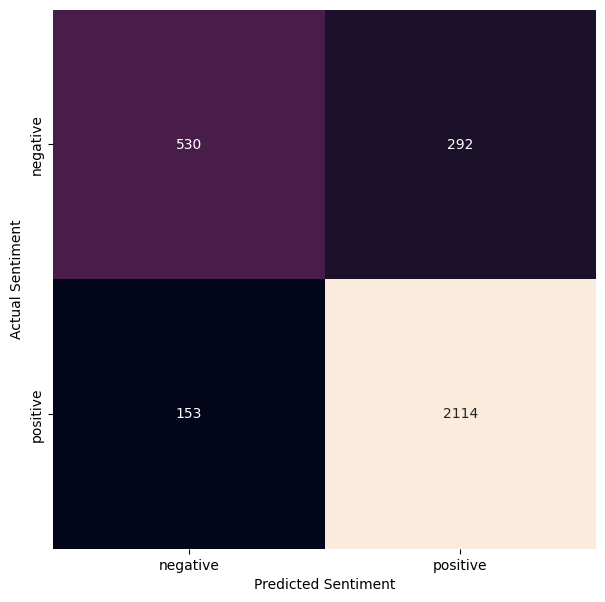

ALPHA =  1
[[ 516  306]
 [ 139 2128]]


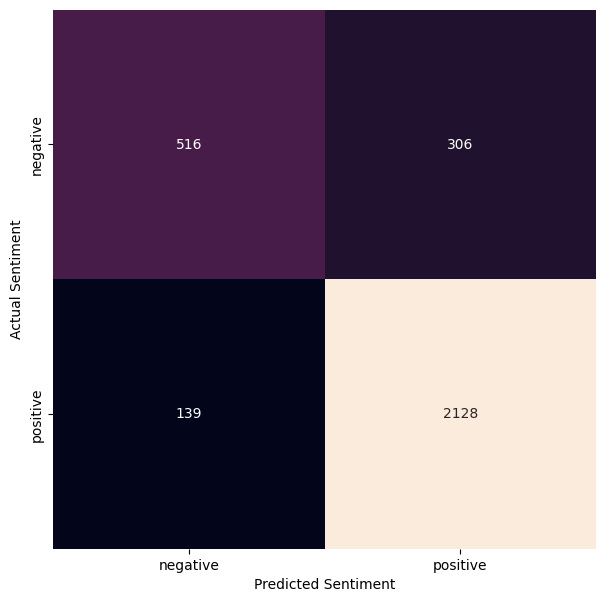

In [62]:
for k in parameter_alpha:

    print("ALPHA = ",k)

    model_naive_based_dataset_1 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_1_30s_tf1, y_train_edom_based_dataset_1_30s) 
        
    predicted_naive_edom_based_dataset_1 = model_naive_based_dataset_1.predict(final_tfidf_data_test_edom_based_dataset_1_30s_tf1)

    #TESTING MENGGUNAKAN CM

    labels = ['negative','positive']
    cm = confusion_matrix(y_test_edom_based_dataset_1_30s, predicted_naive_edom_based_dataset_1)
    print(cm)
    fig, ax = plt.subplots(figsize=(7,7))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False, xticklabels=labels, yticklabels=labels)
    plt.ylabel('Actual Sentiment')
    plt.xlabel('Predicted Sentiment')
    plt.show()




### TEST SIZE 0.2

#### TRANSFORM 1

In [63]:
X_train_edom_based_dataset_2_30s, X_test_edom_based_dataset_2_30s, y_train_edom_based_dataset_2_30s, y_test_edom_based_dataset_2_30s = train_test_split(
    df_edom_naive_check_dataset30s['stemming'], df_edom_naive_check_dataset30s['label'],
                                                    test_size=0.2, random_state=42)

    
corpus_train_edom_based_dataset_2_30s = X_train_edom_based_dataset_2_30s.to_list()
corpus_test_edom_based_dataset_2_30s = X_test_edom_based_dataset_2_30s.to_list()



In [64]:
Vocabulary_edom_based_dataset_2_30s, idf_of_vocabulary_edom_based_dataset_2_30s=fit(corpus_train_edom_based_dataset_2_30s)

In [65]:
#train

final_data_train_edom_based_dataset_2_30s_tf1= transform(corpus_train_edom_based_dataset_2_30s, Vocabulary_edom_based_dataset_2_30s, idf_of_vocabulary_edom_based_dataset_2_30s)
final_tfidf_data_train_edom_based_dataset_2_30s_tf1 = final_data_train_edom_based_dataset_2_30s_tf1.toarray()

#test

final_data_test_edom_based_dataset_2_30s_tf1= transform(corpus_test_edom_based_dataset_2_30s, Vocabulary_edom_based_dataset_2_30s, idf_of_vocabulary_edom_based_dataset_2_30s)
final_tfidf_data_test_edom_based_dataset_2_30s_tf1 = final_data_test_edom_based_dataset_2_30s_tf1.toarray()

c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


In [66]:
hasil_akurasi_test_2_30s_tf1 = []
hasil_recall_test_2_30s_tf1 = []
hasil_presisi_test_2_30s_tf1 = []
hasil_f2_test_2_30s_tf1 = []

for k in parameter_alpha:

    model_naive_based_dataset_2 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_2_30s_tf1, y_train_edom_based_dataset_2_30s) 
        
    predicted_naive_edom_based_dataset_2 = model_naive_based_dataset_2.predict(final_tfidf_data_test_edom_based_dataset_2_30s_tf1)
    accuracy_based_dataset_2 = accuracy_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2)*100
        
    print("Alpha = " + str(k))
    print("\n\n")
    print("accuracy = " + str(accuracy_based_dataset_2))
    print(classification_report(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2))

    recall_hasil = recall_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2, average='macro')
    presisi_hasil = precision_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2, average='macro')
    f2_hasil = f1_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2, average='macro')

    print('Recall: {}'.format(recall_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2, average='macro')))
    print('Precision: {}'.format(precision_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2, average='macro')))
    print('F2-Score: {}'.format(f1_score(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2, average='macro')))

    hasil_akurasi_test_2_30s_tf1.append(accuracy_based_dataset_2)
    hasil_recall_test_2_30s_tf1.append(recall_hasil)
    hasil_presisi_test_2_30s_tf1.append(presisi_hasil)
    hasil_f2_test_2_30s_tf1.append(f2_hasil)

    print("\n\n")

Alpha = 0.1



accuracy = 84.81709291032696
              precision    recall  f1-score   support

    negative       0.70      0.76      0.73      1645
    positive       0.91      0.88      0.89      4533

    accuracy                           0.85      6178
   macro avg       0.80      0.82      0.81      6178
weighted avg       0.85      0.85      0.85      6178

Recall: 0.8208196964241292
Precision: 0.8034746264006606
F2-Score: 0.8112626881440965



Alpha = 0.2



accuracy = 85.38361929426999
              precision    recall  f1-score   support

    negative       0.71      0.76      0.73      1645
    positive       0.91      0.89      0.90      4533

    accuracy                           0.85      6178
   macro avg       0.81      0.82      0.82      6178
weighted avg       0.86      0.85      0.86      6178

Recall: 0.8227437830110429
Precision: 0.8110036711038331
F2-Score: 0.8164909146500621



Alpha = 0.3



accuracy = 85.59404337973454
              precision    recall  f

ALPHA =  0.1
[[1254  391]
 [ 547 3986]]


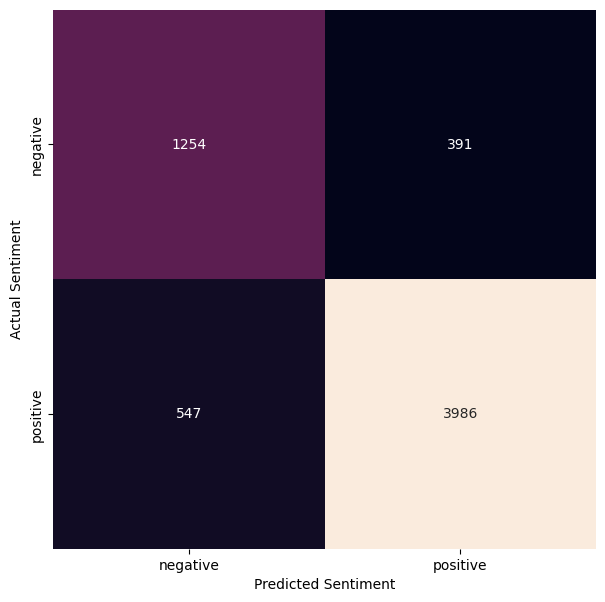

ALPHA =  0.2
[[1244  401]
 [ 502 4031]]


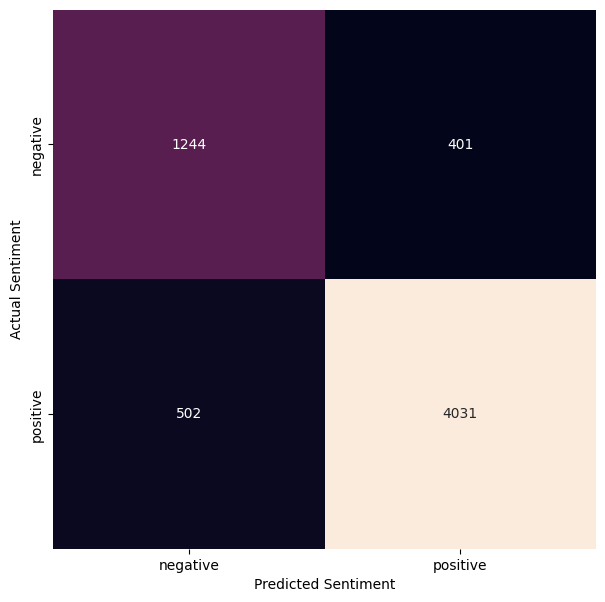

ALPHA =  0.3
[[1221  424]
 [ 466 4067]]


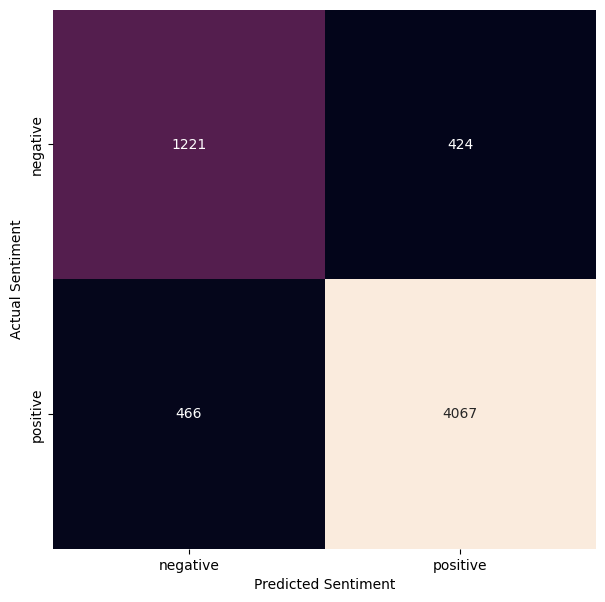

ALPHA =  0.4
[[1187  458]
 [ 420 4113]]


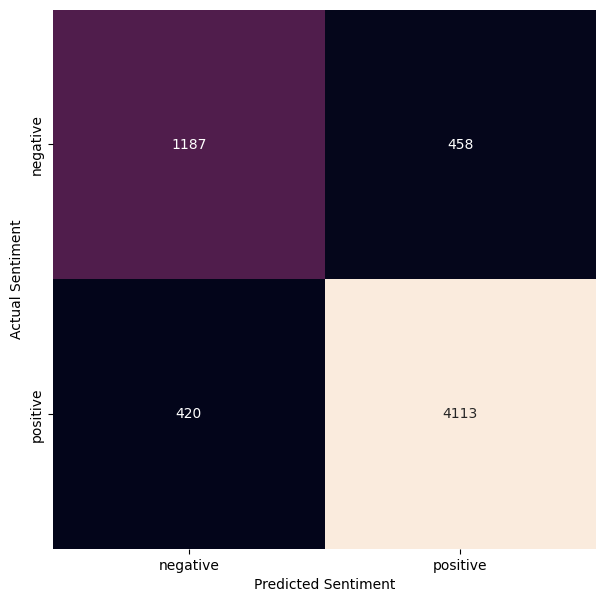

ALPHA =  0.5
[[1165  480]
 [ 385 4148]]


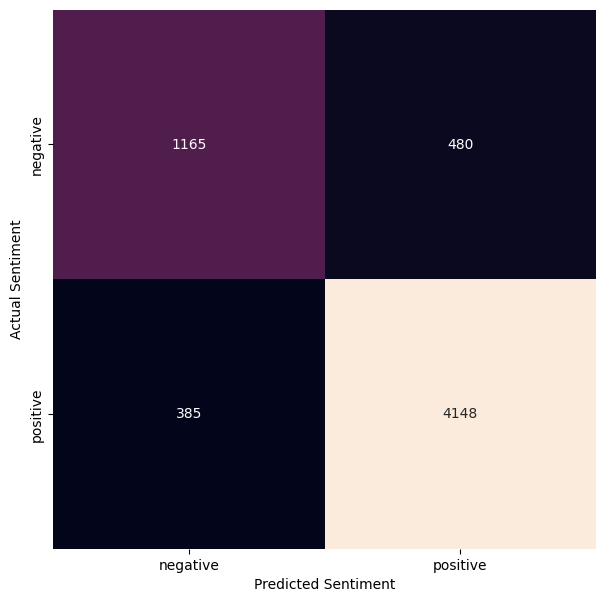

ALPHA =  0.6
[[1129  516]
 [ 345 4188]]


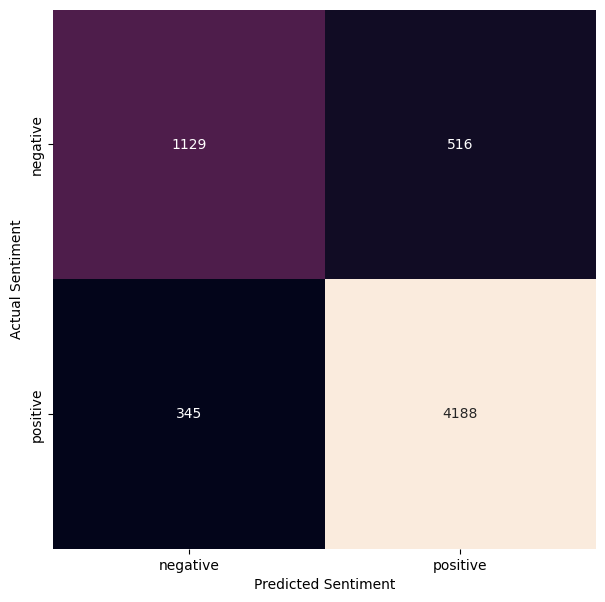

ALPHA =  0.7
[[1094  551]
 [ 319 4214]]


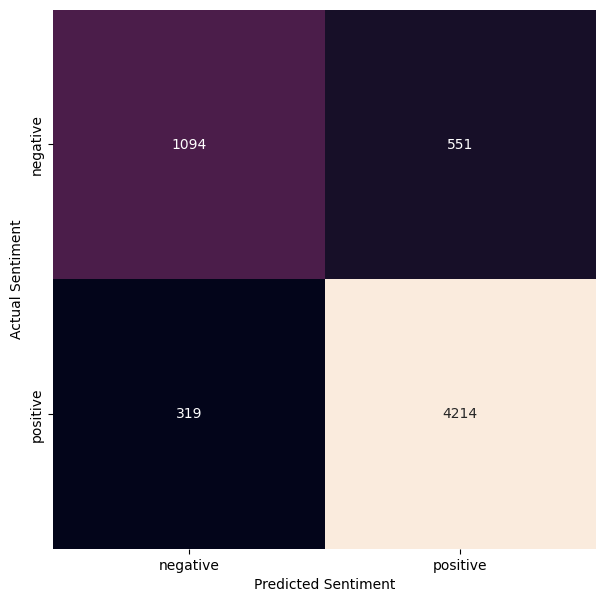

ALPHA =  0.8
[[1057  588]
 [ 293 4240]]


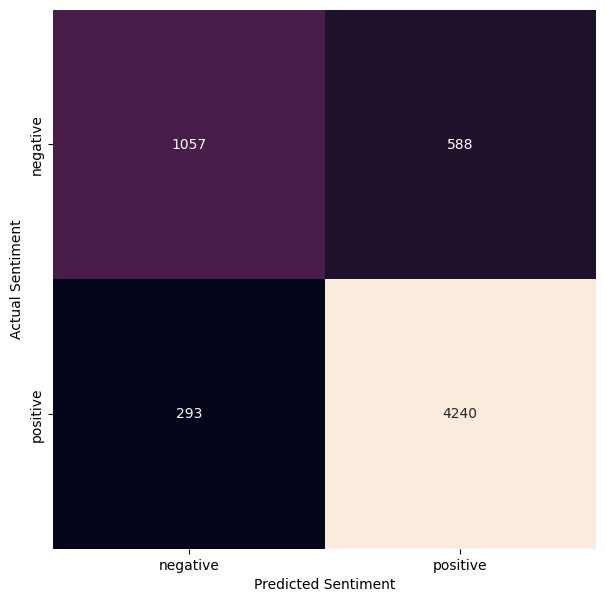

ALPHA =  0.9
[[1029  616]
 [ 270 4263]]


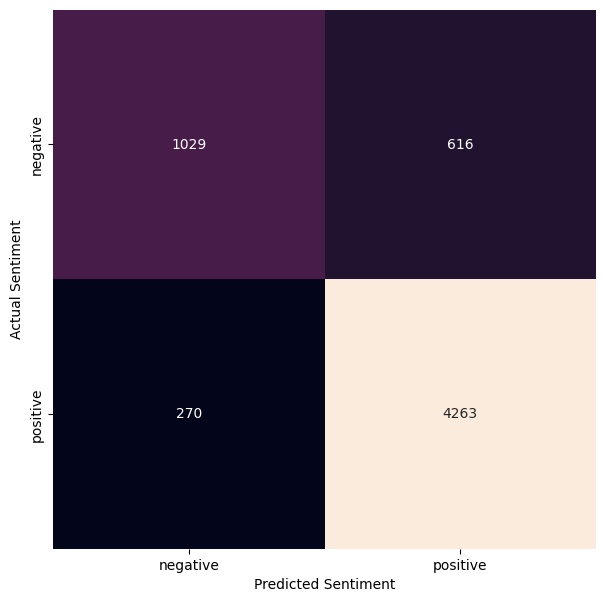

ALPHA =  1
[[1005  640]
 [ 248 4285]]


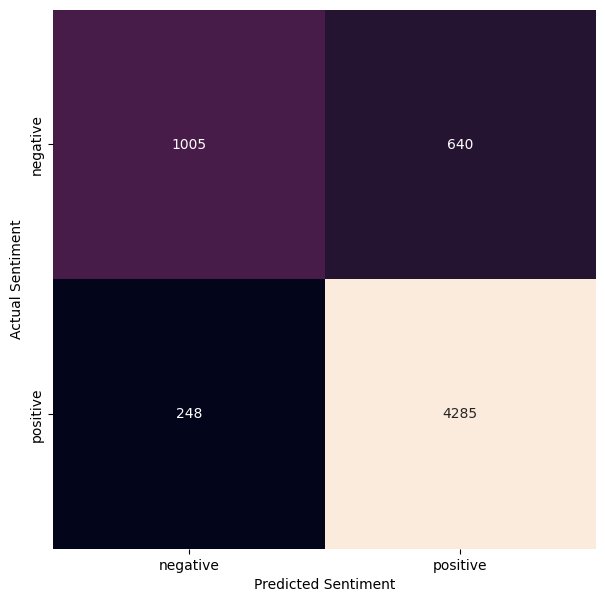

In [67]:
for k in parameter_alpha:

    print("ALPHA = ",k)

    model_naive_based_dataset_2 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_2_30s_tf1, y_train_edom_based_dataset_2_30s) 
        
    predicted_naive_edom_based_dataset_2 = model_naive_based_dataset_2.predict(final_tfidf_data_test_edom_based_dataset_2_30s_tf1)

    #TESTING MENGGUNAKAN CM

    labels = ['negative','positive']
    cm = confusion_matrix(y_test_edom_based_dataset_2_30s, predicted_naive_edom_based_dataset_2)
    print(cm)
    fig, ax = plt.subplots(figsize=(7,7))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False, xticklabels=labels, yticklabels=labels)
    plt.ylabel('Actual Sentiment')
    plt.xlabel('Predicted Sentiment')
    plt.show()




### TEST SIZE 0.3

In [68]:
X_train_edom_based_dataset_3_30s, X_test_edom_based_dataset_3_30s, y_train_edom_based_dataset_3_30s, y_test_edom_based_dataset_3_30s = train_test_split(
    df_edom_naive_check_dataset30s['stemming'], df_edom_naive_check_dataset30s['label'],
                                                    test_size=0.3, random_state=42)

    
corpus_train_edom_based_dataset_3_30s = X_train_edom_based_dataset_3_30s.to_list()
corpus_test_edom_based_dataset_3_30s = X_test_edom_based_dataset_3_30s.to_list()



In [69]:
Vocabulary_edom_based_dataset_3_30s, idf_of_vocabulary_edom_based_dataset_3_30s=fit(corpus_train_edom_based_dataset_3_30s)

In [70]:
#train

final_data_train_edom_based_dataset_3_30s_tf1= transform(corpus_train_edom_based_dataset_3_30s, Vocabulary_edom_based_dataset_3_30s, idf_of_vocabulary_edom_based_dataset_3_30s)
final_tfidf_data_train_edom_based_dataset_3_30s_tf1 = final_data_train_edom_based_dataset_3_30s_tf1.toarray()

#test

final_data_test_edom_based_dataset_3_30s_tf1= transform(corpus_test_edom_based_dataset_3_30s, Vocabulary_edom_based_dataset_3_30s, idf_of_vocabulary_edom_based_dataset_3_30s)
final_tfidf_data_test_edom_based_dataset_3_30s_tf1 = final_data_test_edom_based_dataset_3_30s_tf1.toarray()

c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


In [71]:
hasil_akurasi_test_3_30s_tf1 = []
hasil_recall_test_3_30s_tf1 = []
hasil_presisi_test_3_30s_tf1 = []
hasil_f2_test_3_30s_tf1 = []

for k in parameter_alpha:

    model_naive_based_dataset_3 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_3_30s_tf1, y_train_edom_based_dataset_3_30s) 
        
    predicted_naive_edom_based_dataset_3 = model_naive_based_dataset_3.predict(final_tfidf_data_test_edom_based_dataset_3_30s_tf1)
    accuracy_based_dataset_3 = accuracy_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3)*100
        
    print("Alpha = " + str(k))
    print("\n\n")
    print("accuracy = " + str(accuracy_based_dataset_3))
    print(classification_report(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3))

    recall_hasil = recall_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3, average='macro')
    presisi_hasil = precision_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3, average='macro')
    f2_hasil = f1_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3, average='macro')

    print('Recall: {}'.format(recall_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3, average='macro')))
    print('Precision: {}'.format(precision_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3, average='macro')))
    print('F2-Score: {}'.format(f1_score(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3, average='macro')))

    hasil_akurasi_test_3_30s_tf1.append(accuracy_based_dataset_3)
    hasil_recall_test_3_30s_tf1.append(recall_hasil)
    hasil_presisi_test_3_30s_tf1.append(presisi_hasil)
    hasil_f2_test_3_30s_tf1.append(f2_hasil)

    print("\n\n")

Alpha = 0.1



accuracy = 85.38901478364087
              precision    recall  f1-score   support

    negative       0.72      0.76      0.74      2507
    positive       0.91      0.89      0.90      6760

    accuracy                           0.85      9267
   macro avg       0.81      0.82      0.82      9267
weighted avg       0.86      0.85      0.86      9267

Recall: 0.8236874915915908
Precision: 0.8130509429246129
F2-Score: 0.8180478047439317



Alpha = 0.2



accuracy = 85.87460882702061
              precision    recall  f1-score   support

    negative       0.73      0.75      0.74      2507
    positive       0.91      0.90      0.90      6760

    accuracy                           0.86      9267
   macro avg       0.82      0.82      0.82      9267
weighted avg       0.86      0.86      0.86      9267

Recall: 0.8243808755602655
Precision: 0.820175428889593
F2-Score: 0.8222305842191356



Alpha = 0.3



accuracy = 85.89619078450416
              precision    recall  f1

ALPHA =  0.1
[[1900  607]
 [ 747 6013]]


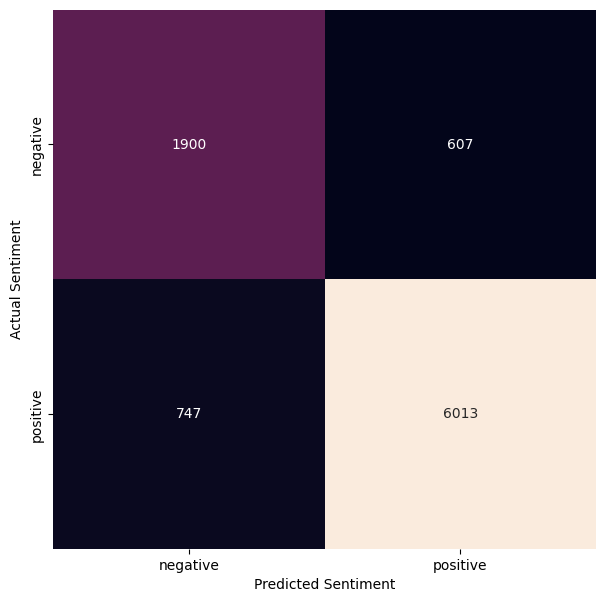

ALPHA =  0.2
[[1879  628]
 [ 681 6079]]


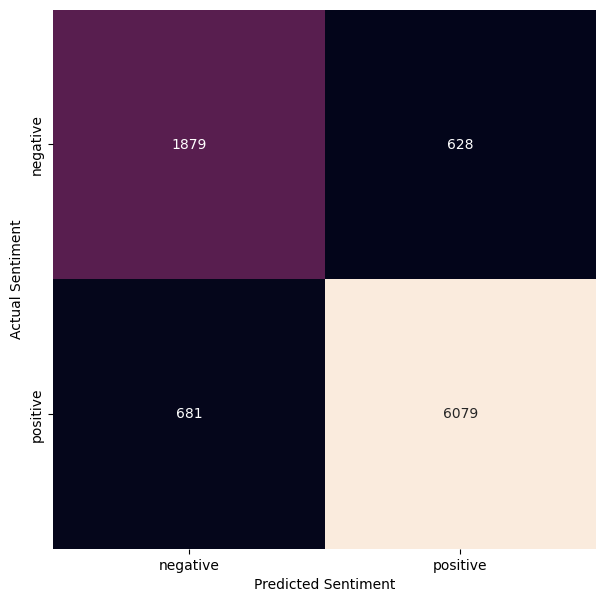

ALPHA =  0.3
[[1834  673]
 [ 634 6126]]


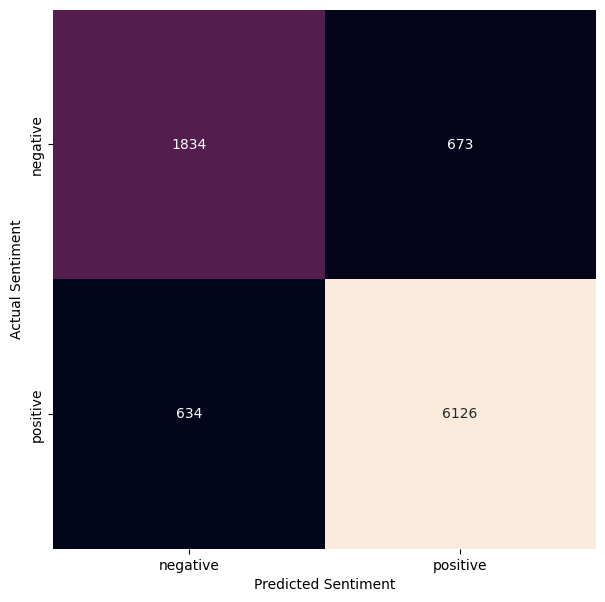

ALPHA =  0.4
[[1783  724]
 [ 584 6176]]


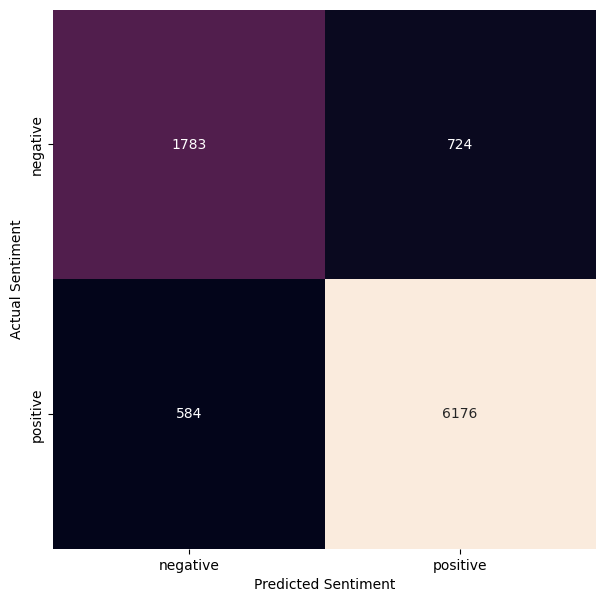

ALPHA =  0.5
[[1723  784]
 [ 524 6236]]


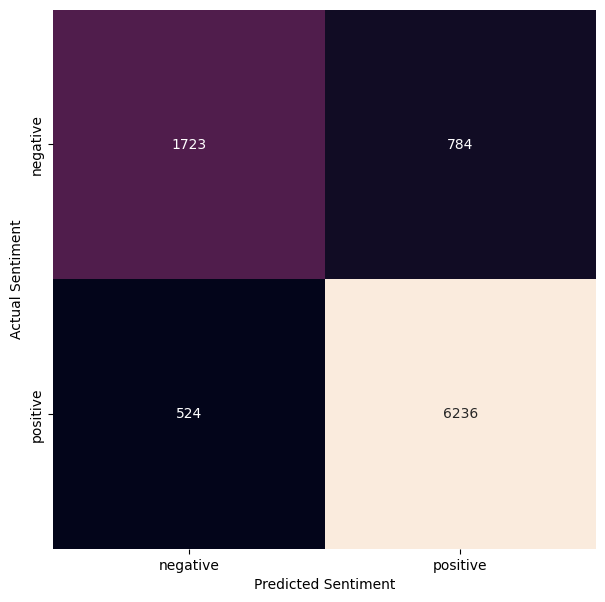

ALPHA =  0.6
[[1674  833]
 [ 478 6282]]


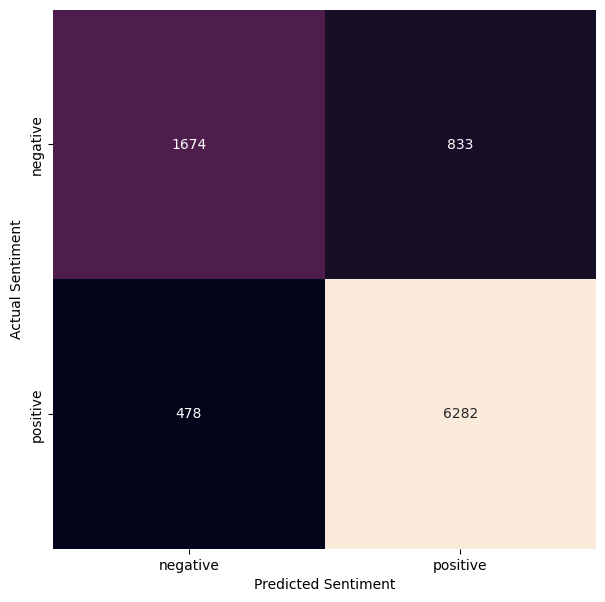

ALPHA =  0.7
[[1623  884]
 [ 442 6318]]


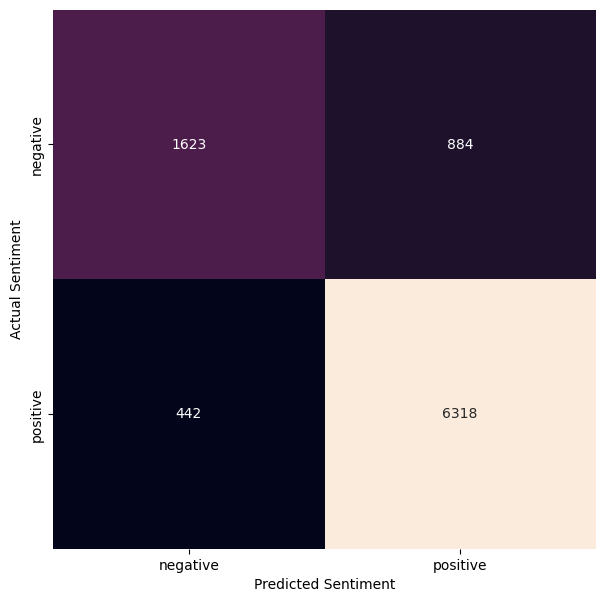

ALPHA =  0.8
[[1571  936]
 [ 403 6357]]


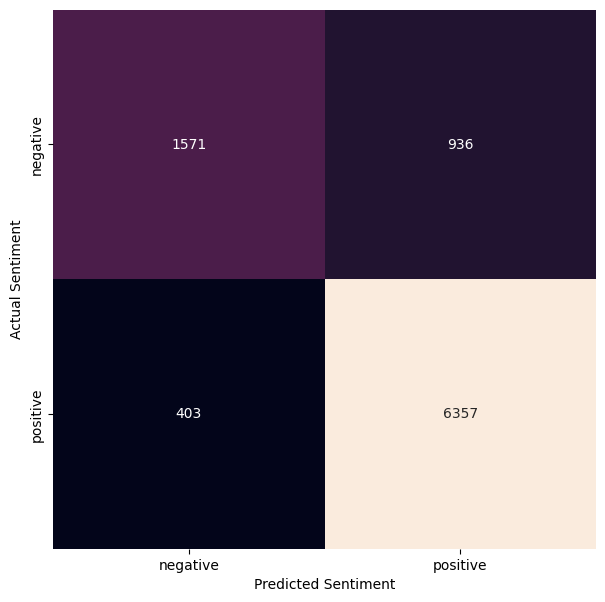

ALPHA =  0.9
[[1524  983]
 [ 379 6381]]


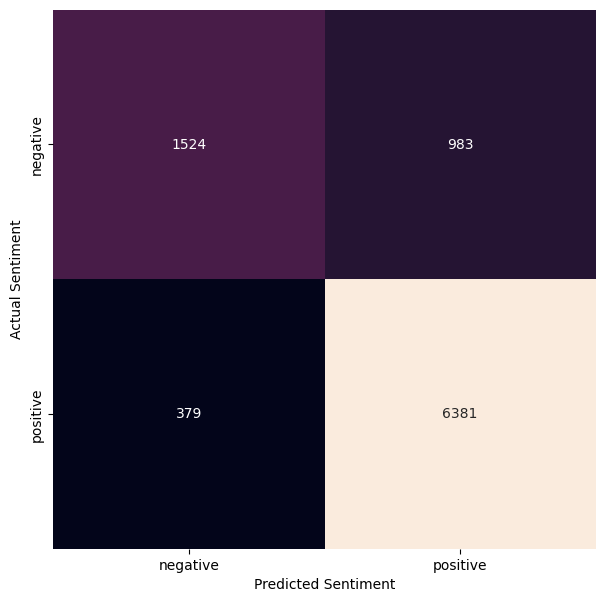

ALPHA =  1
[[1481 1026]
 [ 349 6411]]


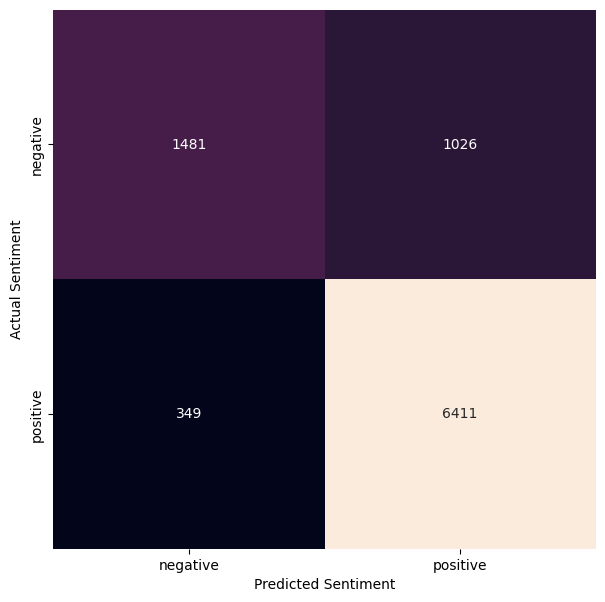

In [72]:
for k in parameter_alpha:

    print("ALPHA = ",k)

    model_naive_based_dataset_3 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_3_30s_tf1, y_train_edom_based_dataset_3_30s) 
        
    predicted_naive_edom_based_dataset_3 = model_naive_based_dataset_3.predict(final_tfidf_data_test_edom_based_dataset_3_30s_tf1)

    #TESTING MENGGUNAKAN CM

    labels = ['negative','positive']
    cm = confusion_matrix(y_test_edom_based_dataset_3_30s, predicted_naive_edom_based_dataset_3)
    print(cm)
    fig, ax = plt.subplots(figsize=(7,7))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False, xticklabels=labels, yticklabels=labels)
    plt.ylabel('Actual Sentiment')
    plt.xlabel('Predicted Sentiment')
    plt.show()




### TEST SIZE 0.4

#### transform 1

In [73]:
X_train_edom_based_dataset_4_30s, X_test_edom_based_dataset_4_30s, y_train_edom_based_dataset_4_30s, y_test_edom_based_dataset_4_30s = train_test_split(
    df_edom_naive_check_dataset30s['stemming'], df_edom_naive_check_dataset30s['label'],
                                                    test_size=0.4, random_state=42)

    
corpus_train_edom_based_dataset_4_30s = X_train_edom_based_dataset_4_30s.to_list()
corpus_test_edom_based_dataset_4_30s = X_test_edom_based_dataset_4_30s.to_list()


Vocabulary_edom_based_dataset_4_30s, idf_of_vocabulary_edom_based_dataset_4_30s=fit(corpus_train_edom_based_dataset_4_30s)
#train

final_data_train_edom_based_dataset_4_30s_tf1= transform(corpus_train_edom_based_dataset_4_30s, Vocabulary_edom_based_dataset_4_30s, idf_of_vocabulary_edom_based_dataset_4_30s)
final_tfidf_data_train_edom_based_dataset_4_30s_tf1 = final_data_train_edom_based_dataset_4_30s_tf1.toarray()

#test

final_data_test_edom_based_dataset_4_30s_tf1= transform(corpus_test_edom_based_dataset_4_30s, Vocabulary_edom_based_dataset_4_30s, idf_of_vocabulary_edom_based_dataset_4_30s)
final_tfidf_data_test_edom_based_dataset_4_30s_tf1 = final_data_test_edom_based_dataset_4_30s_tf1.toarray()


c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


In [74]:
hasil_akurasi_test_4_30s_tf1 = []
hasil_recall_test_4_30s_tf1 = []
hasil_presisi_test_4_30s_tf1 = []
hasil_f2_test_4_30s_tf1 = []

for k in parameter_alpha:

    model_naive_based_dataset_4 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_4_30s_tf1, y_train_edom_based_dataset_4_30s) 
        
    predicted_naive_edom_based_dataset_4 = model_naive_based_dataset_4.predict(final_tfidf_data_test_edom_based_dataset_4_30s_tf1)
    accuracy_based_dataset_4 = accuracy_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4)*100
        
    print("Alpha = " + str(k))
    print("\n\n")
    print("accuracy = " + str(accuracy_based_dataset_4))
    print(classification_report(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4))

    recall_hasil = recall_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4, average='macro')
    presisi_hasil = precision_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4, average='macro')
    f2_hasil = f1_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4, average='macro')

    print('Recall: {}'.format(recall_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4, average='macro')))
    print('Precision: {}'.format(precision_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4, average='macro')))
    print('F2-Score: {}'.format(f1_score(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4, average='macro')))

    hasil_akurasi_test_4_30s_tf1.append(accuracy_based_dataset_4)
    hasil_recall_test_4_30s_tf1.append(recall_hasil)
    hasil_presisi_test_4_30s_tf1.append(presisi_hasil)
    hasil_f2_test_4_30s_tf1.append(f2_hasil)

    print("\n\n")

Alpha = 0.1



accuracy = 85.57785691162188
              precision    recall  f1-score   support

    negative       0.73      0.76      0.74      3364
    positive       0.91      0.89      0.90      8992

    accuracy                           0.86     12356
   macro avg       0.82      0.82      0.82     12356
weighted avg       0.86      0.86      0.86     12356

Recall: 0.8248153464990415
Precision: 0.8164424759722069
F2-Score: 0.8204316004353407



Alpha = 0.2



accuracy = 85.88539980576239
              precision    recall  f1-score   support

    negative       0.74      0.74      0.74      3364
    positive       0.90      0.90      0.90      8992

    accuracy                           0.86     12356
   macro avg       0.82      0.82      0.82     12356
weighted avg       0.86      0.86      0.86     12356

Recall: 0.8219048455279048
Precision: 0.8219048455279048
F2-Score: 0.8219048455279049



Alpha = 0.3



accuracy = 86.03917125283263
              precision    recall  f

ALPHA =  0.1
[[2546  818]
 [ 964 8028]]


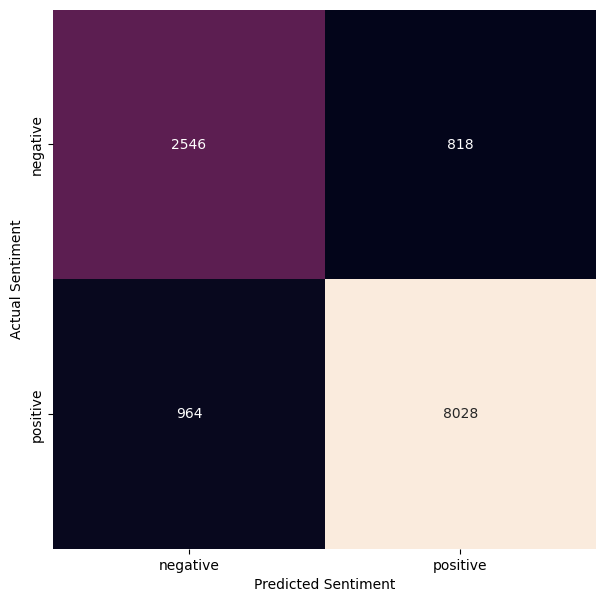

ALPHA =  0.2
[[2492  872]
 [ 872 8120]]


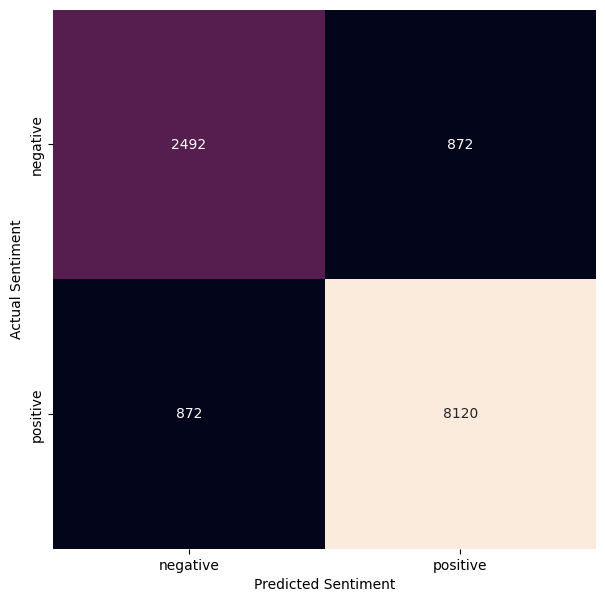

ALPHA =  0.3
[[2429  935]
 [ 790 8202]]


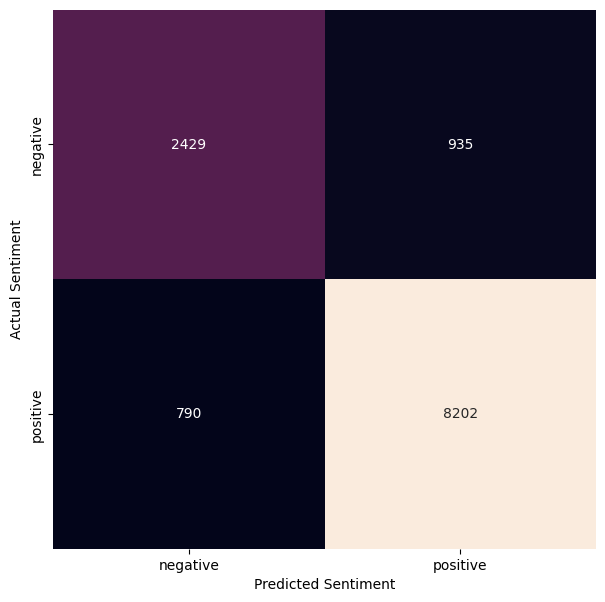

ALPHA =  0.4
[[2370  994]
 [ 725 8267]]


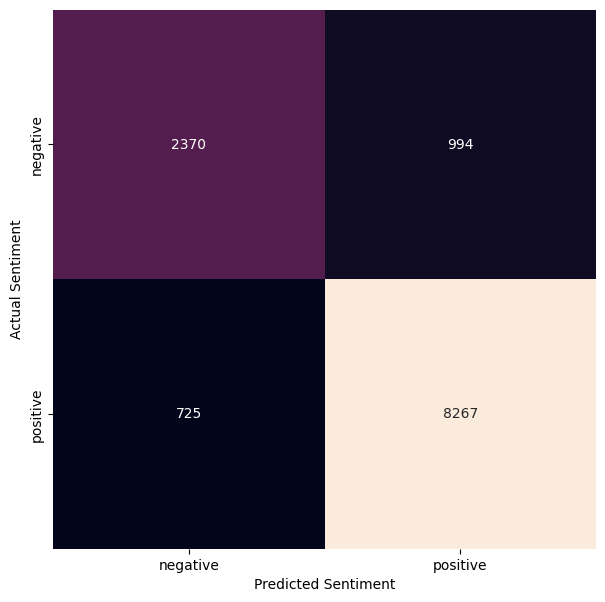

ALPHA =  0.5
[[2303 1061]
 [ 659 8333]]


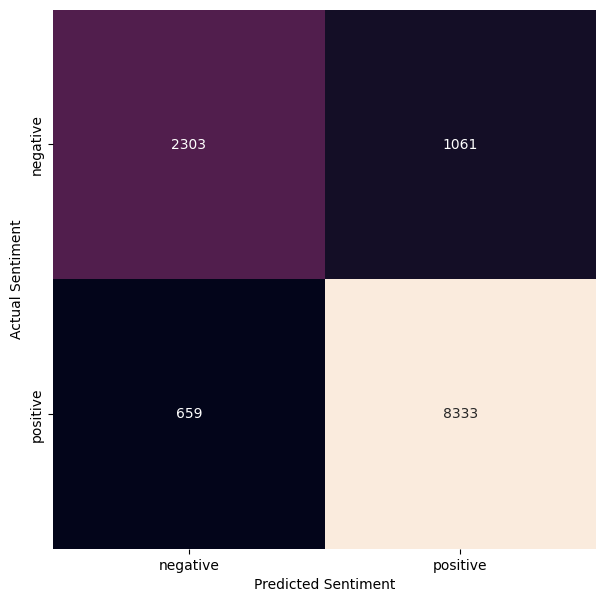

ALPHA =  0.6
[[2218 1146]
 [ 607 8385]]


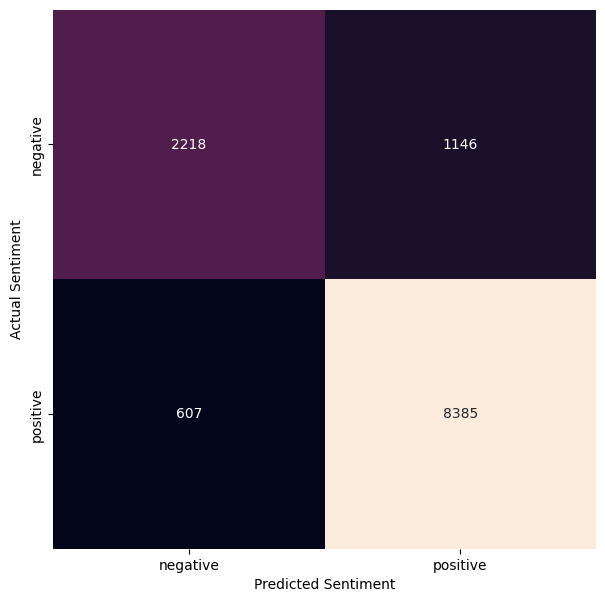

ALPHA =  0.7
[[2138 1226]
 [ 565 8427]]


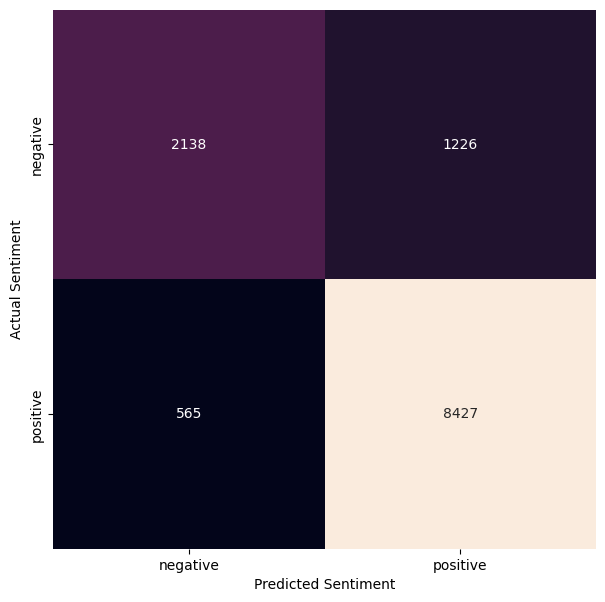

ALPHA =  0.8
[[2064 1300]
 [ 520 8472]]


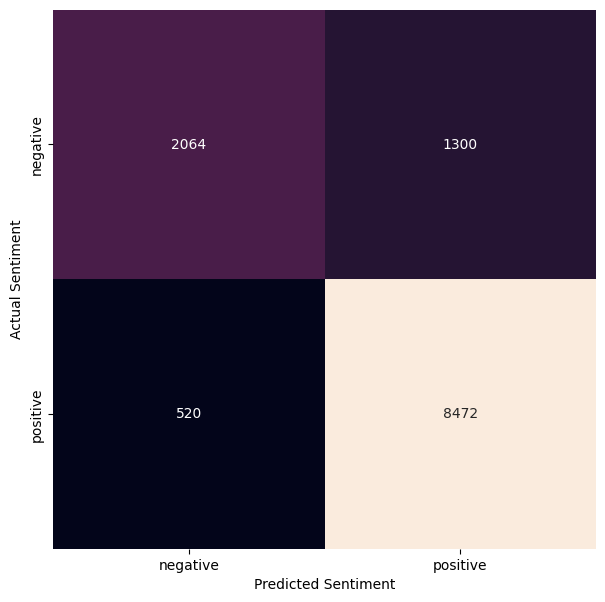

ALPHA =  0.9
[[2013 1351]
 [ 478 8514]]


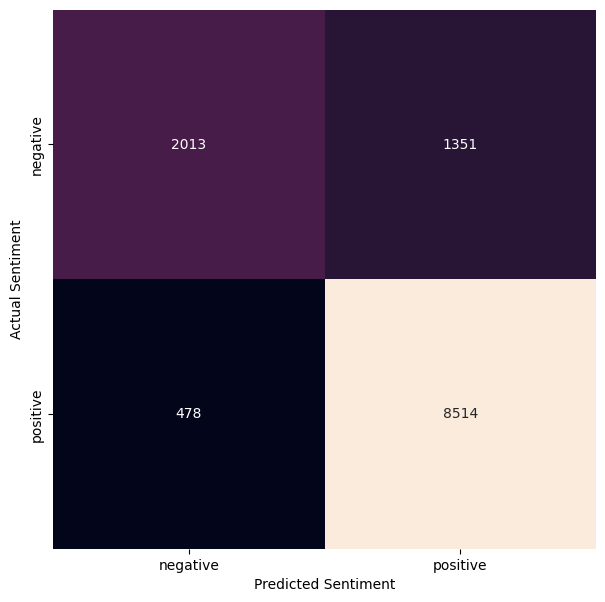

ALPHA =  1
[[1946 1418]
 [ 445 8547]]


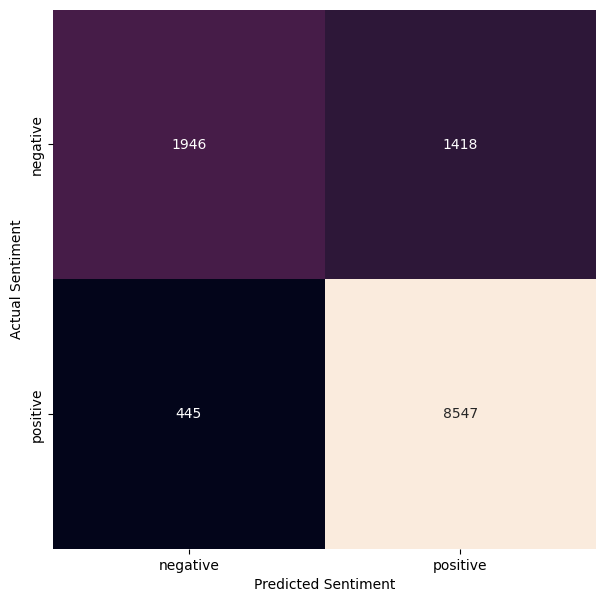

In [75]:
for k in parameter_alpha:

    print("ALPHA = ",k)

    model_naive_based_dataset_4 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_4_30s_tf1, y_train_edom_based_dataset_4_30s) 
        
    predicted_naive_edom_based_dataset_4 = model_naive_based_dataset_4.predict(final_tfidf_data_test_edom_based_dataset_4_30s_tf1)

    #TESTING MENGGUNAKAN CM

    labels = ['negative','positive']
    cm = confusion_matrix(y_test_edom_based_dataset_4_30s, predicted_naive_edom_based_dataset_4)
    print(cm)
    fig, ax = plt.subplots(figsize=(7,7))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False, xticklabels=labels, yticklabels=labels)
    plt.ylabel('Actual Sentiment')
    plt.xlabel('Predicted Sentiment')
    plt.show()




### TEST SIZE 0.5

#### transform 1

In [76]:
X_train_edom_based_dataset_5_30s, X_test_edom_based_dataset_5_30s, y_train_edom_based_dataset_5_30s, y_test_edom_based_dataset_5_30s = train_test_split(
    df_edom_naive_check_dataset30s['stemming'], df_edom_naive_check_dataset30s['label'],
                                                    test_size=0.5, random_state=42)

    
corpus_train_edom_based_dataset_5_30s = X_train_edom_based_dataset_5_30s.to_list()
corpus_test_edom_based_dataset_5_30s = X_test_edom_based_dataset_5_30s.to_list()


Vocabulary_edom_based_dataset_5_30s, idf_of_vocabulary_edom_based_dataset_5_30s=fit(corpus_train_edom_based_dataset_5_30s)
#train

final_data_train_edom_based_dataset_5_30s_tf1= transform(corpus_train_edom_based_dataset_5_30s, Vocabulary_edom_based_dataset_5_30s, idf_of_vocabulary_edom_based_dataset_5_30s)
final_tfidf_data_train_edom_based_dataset_5_30s_tf1 = final_data_train_edom_based_dataset_5_30s_tf1.toarray()

#test

final_data_test_edom_based_dataset_5_30s_tf1= transform(corpus_test_edom_based_dataset_5_30s, Vocabulary_edom_based_dataset_5_30s, idf_of_vocabulary_edom_based_dataset_5_30s)
final_tfidf_data_test_edom_based_dataset_5_30s_tf1 = final_data_test_edom_based_dataset_5_30s_tf1.toarray()

c:\Users\dianr\.conda\envs\text\lib\site-packages\scipy\sparse\_index.py:82: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


In [77]:
hasil_akurasi_test_5_30s_tf1 = []
hasil_recall_test_5_30s_tf1 = []
hasil_presisi_test_5_30s_tf1 = []
hasil_f2_test_5_30s_tf1 = []

for k in parameter_alpha:

    model_naive_based_dataset_5 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_5_30s_tf1, y_train_edom_based_dataset_5_30s) 
        
    predicted_naive_edom_based_dataset_5 = model_naive_based_dataset_5.predict(final_tfidf_data_test_edom_based_dataset_5_30s_tf1)
    accuracy_based_dataset_5 = accuracy_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5)*100
        
    print("Alpha = " + str(k))
    print("\n\n")
    print("accuracy = " + str(accuracy_based_dataset_5))
    print(classification_report(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5))

    recall_hasil = recall_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5, average='macro')
    presisi_hasil = precision_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5, average='macro')
    f2_hasil = f1_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5, average='macro')

    print('Recall: {}'.format(recall_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5, average='macro')))
    print('Precision: {}'.format(precision_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5, average='macro')))
    print('F2-Score: {}'.format(f1_score(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5, average='macro')))

    hasil_akurasi_test_5_30s_tf1.append(accuracy_based_dataset_5)
    hasil_recall_test_5_30s_tf1.append(recall_hasil)
    hasil_presisi_test_5_30s_tf1.append(presisi_hasil)
    hasil_f2_test_5_30s_tf1.append(f2_hasil)

    print("\n\n")

Alpha = 0.1



accuracy = 85.0760764001295
              precision    recall  f1-score   support

    negative       0.71      0.74      0.73      4164
    positive       0.90      0.89      0.90     11281

    accuracy                           0.85     15445
   macro avg       0.81      0.82      0.81     15445
weighted avg       0.85      0.85      0.85     15445

Recall: 0.8167039616993915
Precision: 0.8092418418167979
F2-Score: 0.8128148586474164



Alpha = 0.2



accuracy = 85.5681450307543
              precision    recall  f1-score   support

    negative       0.73      0.73      0.73      4164
    positive       0.90      0.90      0.90     11281

    accuracy                           0.86     15445
   macro avg       0.82      0.82      0.82     15445
weighted avg       0.86      0.86      0.86     15445

Recall: 0.8167392577575328
Precision: 0.8167872606461316
F2-Score: 0.8167632530360089



Alpha = 0.3



accuracy = 85.60051796697961
              precision    recall  f1-

ALPHA =  0.1
[[ 3093  1071]
 [ 1234 10047]]


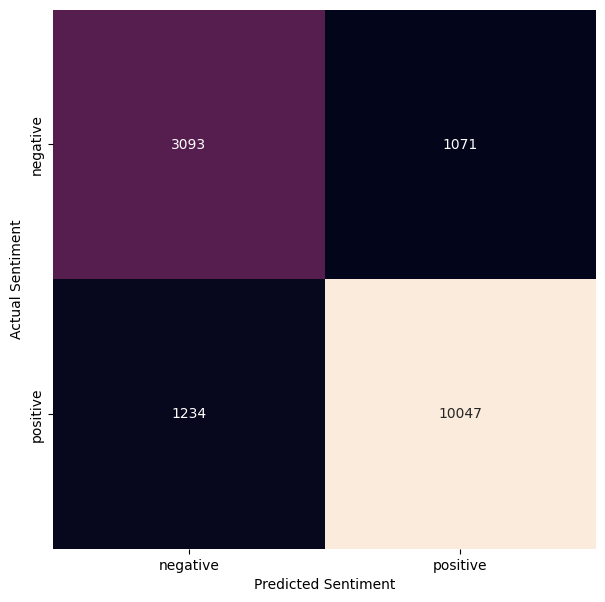

ALPHA =  0.2
[[ 3049  1115]
 [ 1114 10167]]


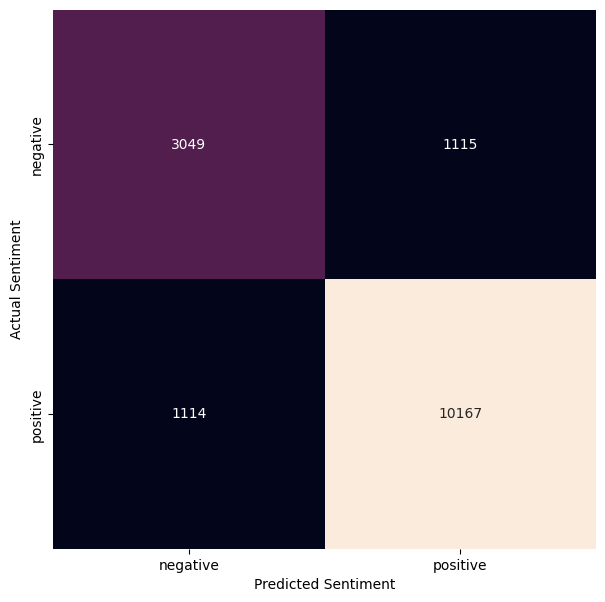

ALPHA =  0.3
[[ 2963  1201]
 [ 1023 10258]]


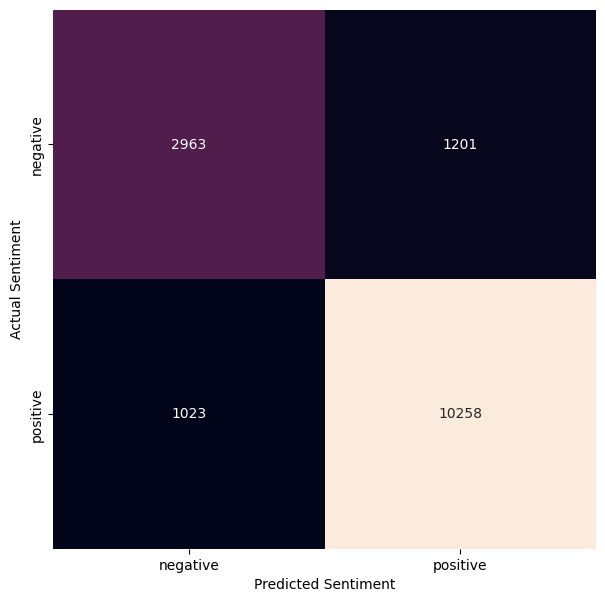

ALPHA =  0.4
[[ 2875  1289]
 [  928 10353]]


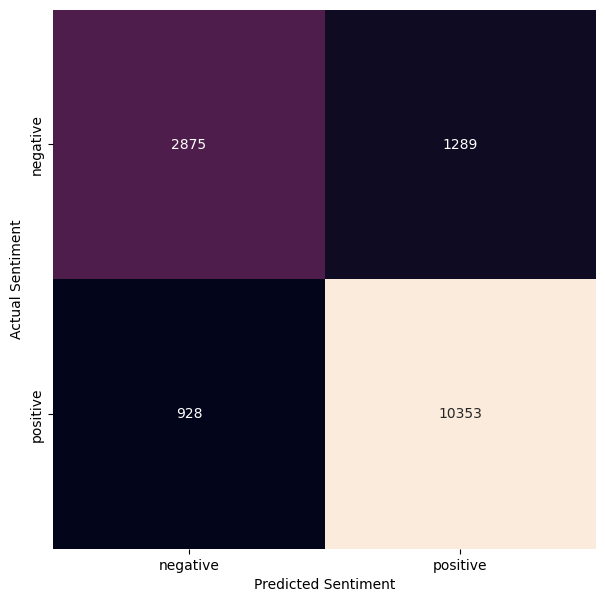

ALPHA =  0.5
[[ 2800  1364]
 [  848 10433]]


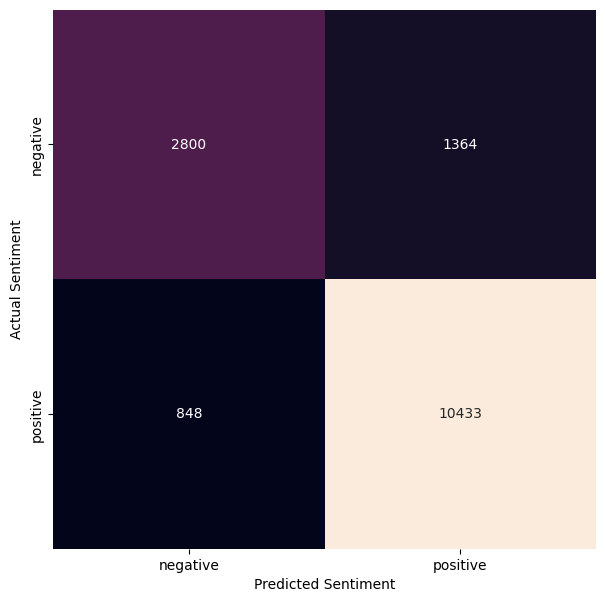

ALPHA =  0.6
[[ 2692  1472]
 [  770 10511]]


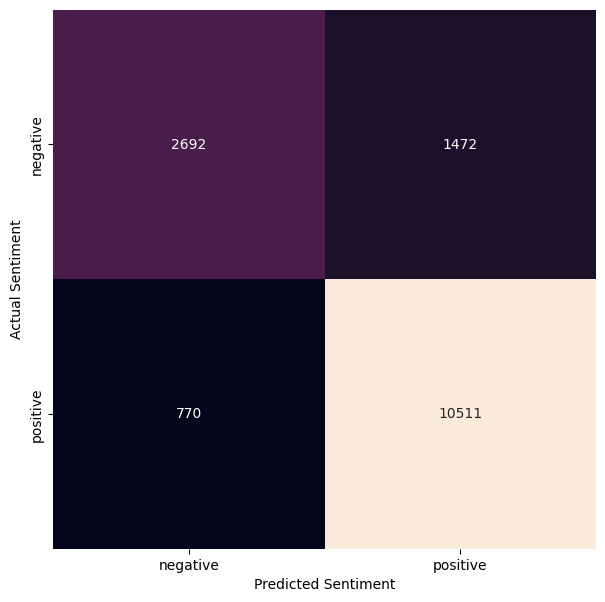

ALPHA =  0.7
[[ 2587  1577]
 [  708 10573]]


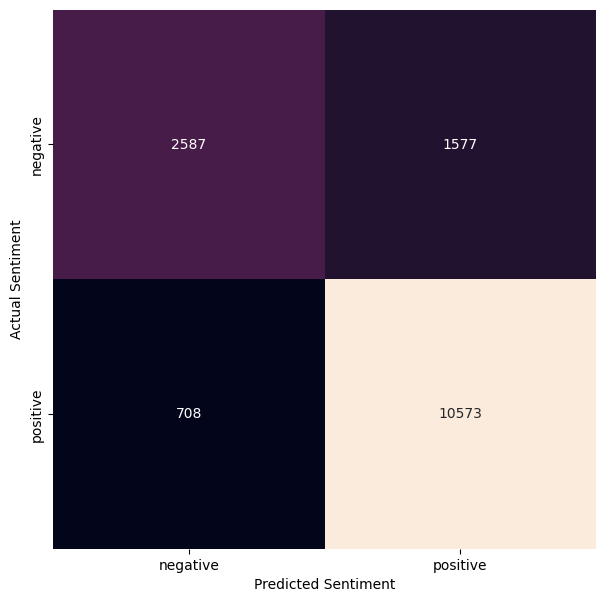

ALPHA =  0.8
[[ 2517  1647]
 [  653 10628]]


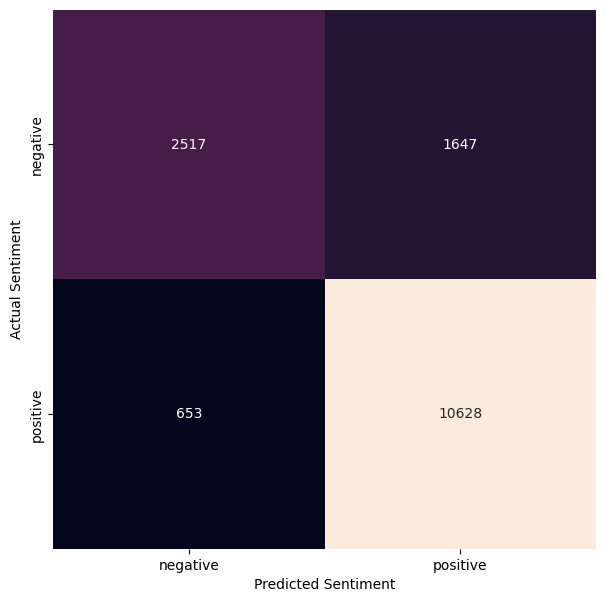

ALPHA =  0.9
[[ 2434  1730]
 [  594 10687]]


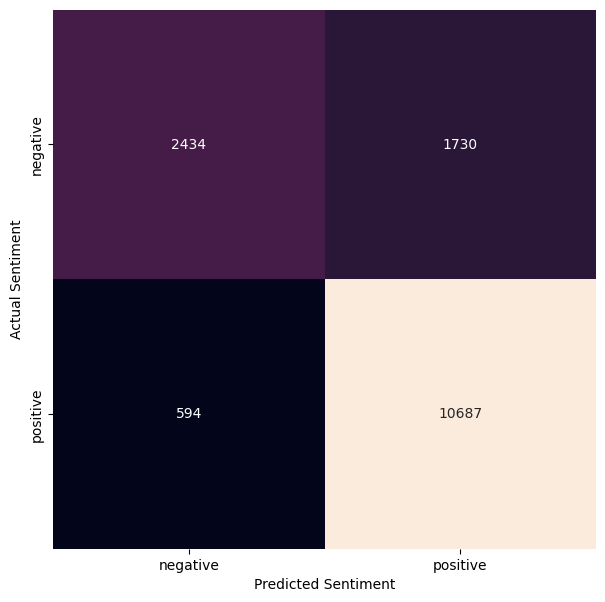

ALPHA =  1
[[ 2353  1811]
 [  550 10731]]


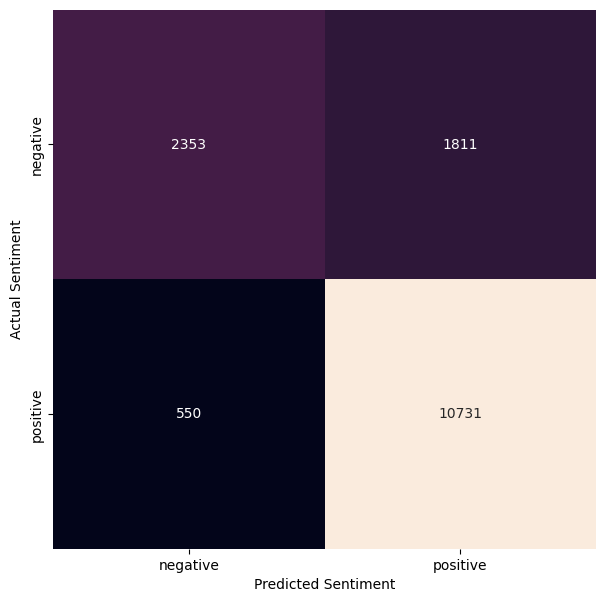

In [78]:
for k in parameter_alpha:

    print("ALPHA = ",k)

    model_naive_based_dataset_5 = ComplementNB(alpha=k).fit(final_tfidf_data_train_edom_based_dataset_5_30s_tf1, y_train_edom_based_dataset_5_30s) 
        
    predicted_naive_edom_based_dataset_5 = model_naive_based_dataset_5.predict(final_tfidf_data_test_edom_based_dataset_5_30s_tf1)

    #TESTING MENGGUNAKAN CM

    labels = ['negative','positive']
    cm = confusion_matrix(y_test_edom_based_dataset_5_30s, predicted_naive_edom_based_dataset_5)
    print(cm)
    fig, ax = plt.subplots(figsize=(7,7))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False, xticklabels=labels, yticklabels=labels)
    plt.ylabel('Actual Sentiment')
    plt.xlabel('Predicted Sentiment')
    plt.show()




# PENGUJIAN MENGGUNAKAN KFOLD

In [79]:
for k in parameter_alpha:

    #TESTING MENGGUNAKAN KFOLD

    kf=KFold(n_splits=10)
    model_naive = ComplementNB(alpha=k)
    score= cross_val_score(model_naive, final_tfidf_all_data, df_edom_naive_check_dataset30s['label'],cv=kf)

    print("ALPHA = ",k)
    print("Cross Validation Scores = {}".format(score))
    print("Average Cross Validation score = {}".format(score.mean()))


ALPHA =  0.1
Cross Validation Scores = [0.83489803 0.8203302  0.82971836 0.82809971 0.82615733 0.81579799
 0.81450308 0.82550987 0.83425057 0.84914212]
Average Cross Validation score = 0.8278407251537715
ALPHA =  0.2
Cross Validation Scores = [0.83878278 0.82162512 0.83522175 0.83068954 0.8345743  0.8203302
 0.81903529 0.83101327 0.83975397 0.84719974]
Average Cross Validation score = 0.8318225963094854
ALPHA =  0.3
Cross Validation Scores = [0.84331499 0.82550987 0.83748786 0.8368404  0.83651667 0.82389123
 0.82227258 0.83522175 0.84040142 0.84817093]
Average Cross Validation score = 0.8349627711233409
ALPHA =  0.4
Cross Validation Scores = [0.84363872 0.83004208 0.84428618 0.84266753 0.84104888 0.82809971
 0.82227258 0.8368404  0.84396245 0.84946585]
Average Cross Validation score = 0.8382324376820979
ALPHA =  0.5
Cross Validation Scores = [0.84752347 0.83295565 0.84687601 0.84687601 0.84363872 0.83295565
 0.82648106 0.83554548 0.84849466 0.85043703]
Average Cross Validation score = 

# PRINT HASIL AKURASI KE CSV

In [80]:
accuracy_results = pd.DataFrame(parameter_alpha, columns =['alpha'])


accuracy_results['akurasi ts 0.1'] = hasil_akurasi_test_1_30s_tf1
accuracy_results['presisi ts 0.1'] = hasil_presisi_test_1_30s_tf1
accuracy_results['recall ts 0.1'] = hasil_recall_test_1_30s_tf1
accuracy_results['f1 score ts 0.1'] = hasil_f2_test_1_30s_tf1

accuracy_results['akurasi ts 0.2'] = hasil_akurasi_test_2_30s_tf1
accuracy_results['presisi ts 0.2'] = hasil_presisi_test_2_30s_tf1
accuracy_results['recall ts 0.2'] = hasil_recall_test_2_30s_tf1
accuracy_results['f1 score ts 0.2'] = hasil_f2_test_2_30s_tf1

accuracy_results['akurasi ts 0.3'] = hasil_akurasi_test_3_30s_tf1
accuracy_results['presisi ts 0.3'] = hasil_presisi_test_3_30s_tf1
accuracy_results['recall ts 0.3'] = hasil_recall_test_3_30s_tf1
accuracy_results['f1 score ts 0.3'] = hasil_f2_test_3_30s_tf1

accuracy_results['akurasi ts 0.4'] = hasil_akurasi_test_4_30s_tf1
accuracy_results['presisi ts 0.4'] = hasil_presisi_test_4_30s_tf1
accuracy_results['recall ts 0.4'] = hasil_recall_test_4_30s_tf1
accuracy_results['f1 score ts 0.4'] = hasil_f2_test_4_30s_tf1

accuracy_results['akurasi ts 0.5'] = hasil_akurasi_test_5_30s_tf1
accuracy_results['presisi ts 0.5'] = hasil_presisi_test_5_30s_tf1
accuracy_results['recall ts 0.5'] = hasil_recall_test_5_30s_tf1
accuracy_results['f1 score ts 0.5'] = hasil_f2_test_5_30s_tf1


In [81]:
accuracy_results.to_csv(r'hasil akurasi presisi recall 30rb data stem bru.csv', index = False, header = True,index_label=None)